# 0. Pacotes

In [1]:
!pip install prettytable


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sns
from matplotlib.pylab import rcParams
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
%matplotlib inline
import plotly.express as px
from tabulate import tabulate
from prettytable import PrettyTable


In [3]:
GoogleTrends = pd.read_csv(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\BaseGoogleTrends.csv", sep=',')

In [4]:
BaseANAC = pd.read_json(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\BaseANAC3.json")
BaseIPAC = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\ipca_202302SerieHist_mod.xls")
BaseDolar = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\USD_BRL Dados Históricos.xlsx")
BaseDesempRenda = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\tabela desemprego_tratada.xlsx")
BaseSalarioMinimo = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\Salario minimo ipea.xls")
BaseSelic = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\ipeadata_SelicCopom_mod.xlsx")
BaseTarifa = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\TarifasConsolidadas_mod.xlsx")
BaseDesempRenda2 =  pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\ConsolidadoRendaDesemprego.xlsx")

In [5]:
ICMS_Brasil = pd.read_csv(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\ipeadata icms brasil.csv", sep=';',decimal = ",")
ICMS_RJ = pd.read_csv(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\ipea icms RJ.csv", sep=';',decimal = ",")

## 1.BASE ANAC

Detalhamento: https://www.anac.gov.br/acesso-a-informacao/dados-abertos/areas-de-atuacao/voos-e-operacoes-aereas/dados-estatisticos-do-transporte-aereo/48-dados-estatisticos-do-transporte-aereo

In [6]:
BaseANACgov = pd.read_excel(r"C:\Users\jgjoa\Desktop\FGV\Dissertação\BaseANACgov2.xlsx")


In [7]:
BaseANACgov = BaseANACgov[BaseANACgov['PASSAGEIROS_PAGOS']>0]
BaseANACgov

,EMPRESA_SIGLA,EMPRESA_NOME,EMPRESA_NACIONALIDADE,ANO,MES,Mes-Ano,AEROPORTO_DE_ORIGEM_SIGLA,AEROPORTO_DE_ORIGEM_NOME,AEROPORTO_DE_ORIGEM_UF,AEROPORTO_DE_ORIGEM_REGIAO,...,AEROPORTO_DE_DESTINO_NOME,AEROPORTO_DE_DESTINO_UF,AEROPORTO_DE_DESTINO_REGIAO,AEROPORTO_DE_DESTINO_PAIS,AEROPORTO_DE_DESTINO_CONTINENTE,NATUREZA,GRUPO_DE_VOO,PASSAGEIROS_PAGOS,PASSAGEIROS_GRATIS,ASSENTOS
0,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,KDFW,"DALLAS & FORT WORTH, TEXAS",NaN,NaN,...,GUARULHOS,SP,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,3932.0,142.0,6330.0
1,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,KJFK,"NEW YORK, NEW YORK",NaN,NaN,...,RIO DE JANEIRO,RJ,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,2338.0,131.0,6119.0
2,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,KJFK,"NEW YORK, NEW YORK",NaN,NaN,...,GUARULHOS,SP,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,2892.0,127.0,6119.0
3,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,KMIA,"MIAMI, FLORIDA",NaN,NaN,...,CONFINS,MG,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,997.0,20.0,NaN
4,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,KMIA,"MIAMI, FLORIDA",NaN,NaN,...,RIO DE JANEIRO,RJ,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,3589.0,133.0,6541.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966121,UAL,"UNITED AIRLINES, INC",ESTRANGEIRA,2023,3,2023-03-01,SBGR,GUARULHOS,SP,SUDESTE,...,"CHICAGO, ILLINOIS",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,7526.0,219.0,8015.0
966162,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,1,2023-01-01,SBGR,GUARULHOS,SP,SUDESTE,...,MEDELLÍN/RIONEGRO,NaN,NaN,COLÔMBIA,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,2752.0,0.0,3460.0
966163,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,1,2023-01-01,SKRG,MEDELLÍN/RIONEGRO,NaN,NaN,...,GUARULHOS,SP,SUDESTE,BRASIL,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,2594.0,0.0,3600.0
966164,VVC,VIVA AIR - FAST COLOMBIA,ESTRANGEIRA,2023,2,2023-02-01,SBGR,GUARULHOS,SP,SUDESTE,...,MEDELLÍN/RIONEGRO,NaN,NaN,COLÔMBIA,AMÉRICA DO SUL,INTERNACIONAL,REGULAR,2475.0,0.0,3114.0


In [8]:
BaseANACgov.describe()

,ANO,MES,PASSAGEIROS_PAGOS,PASSAGEIROS_GRATIS,ASSENTOS
count,682726.000000,682726.000000,682726.000000,682726.000000,525982.000000
mean,2010.314065,6.427214,2677.037071,57.582871,5156.534011
std,6.495306,3.527236,5098.240645,175.376925,8133.736180
min,2000.000000,1.000000,1.000000,0.000000,0.000000
25%,2005.000000,3.000000,118.000000,0.000000,435.000000
50%,2010.000000,6.000000,651.000000,5.000000,2628.000000
75%,2016.000000,10.000000,3107.000000,44.000000,6656.000000
max,2023.000000,12.000000,92357.000000,7452.000000,154845.000000


In [9]:
BaseANACgov2= BaseANACgov.groupby(["Mes-Ano","ANO","MES"], as_index=False)['PASSAGEIROS_PAGOS'].sum()
BaseANACgov2


,Mes-Ano,ANO,MES,PASSAGEIROS_PAGOS
0,2000-01-01,2000,1,3351571.0
1,2000-02-01,2000,2,2919936.0
2,2000-03-01,2000,3,3170764.0
3,2000-04-01,2000,4,3106148.0
4,2000-05-01,2000,5,2965231.0
...,...,...,...,...
274,2022-11-01,2022,11,8860265.0
275,2022-12-01,2022,12,9339419.0
276,2023-01-01,2023,1,10180464.0
277,2023-02-01,2023,2,8157666.0


In [10]:
BaseANACgov2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279 entries, 0 to 278
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Mes-Ano            279 non-null    datetime64[ns]
 1   ANO                279 non-null    int64         
 2   MES                279 non-null    int64         
 3   PASSAGEIROS_PAGOS  279 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 8.8 KB


In [11]:
BaseANACgov2.describe()

,ANO,MES,PASSAGEIROS_PAGOS
count,279.000000,279.000000,2.790000e+02
mean,2011.129032,6.451613,6.550834e+06
std,6.724634,3.471931,2.753477e+06
min,2000.000000,1.000000,4.387100e+05
25%,2005.000000,3.000000,3.814396e+06
50%,2011.000000,6.000000,6.474500e+06
75%,2017.000000,9.000000,9.087566e+06
max,2023.000000,12.000000,1.157676e+07


In [12]:
fig = px.bar(BaseANACgov2[["ANO","PASSAGEIROS_PAGOS"]], x="ANO", y="PASSAGEIROS_PAGOS", title="")
fig.show()

In [13]:
fig = px.line(BaseANACgov2[["Mes-Ano","PASSAGEIROS_PAGOS"]], x="Mes-Ano", y="PASSAGEIROS_PAGOS", title="")
fig.show()

<AxesSubplot:>

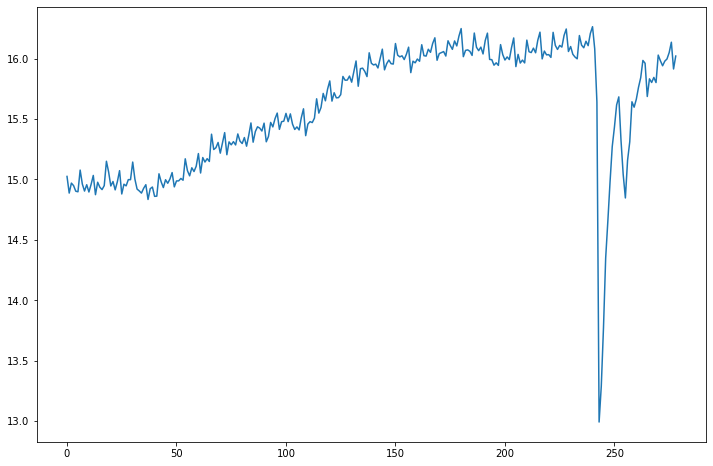

In [14]:
BaseANACgov_log = np.log(BaseANACgov2['PASSAGEIROS_PAGOS'])
BaseANACgov_log.plot(figsize=(12,8))

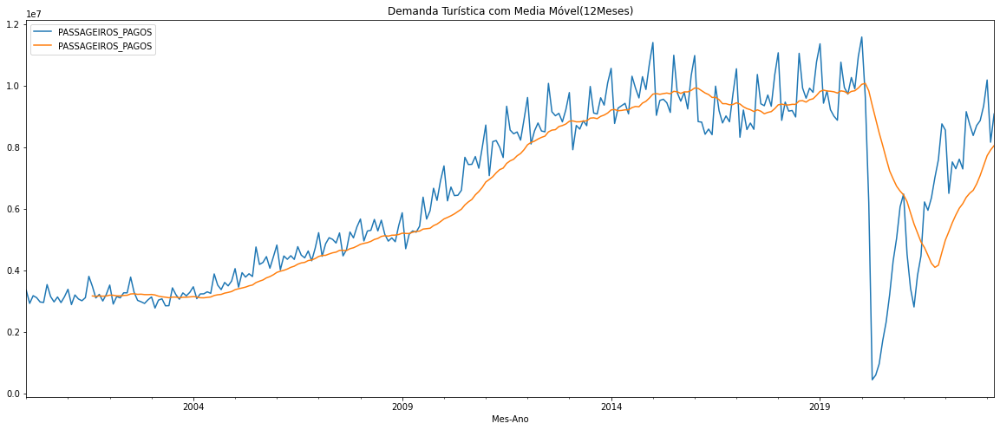

In [15]:
moving_avg = BaseANACgov2[["Mes-Ano", "PASSAGEIROS_PAGOS"]].set_index("Mes-Ano").rolling(window=20, center=False).mean()

fig, ax = plt.subplots(figsize=(20, 8))
ax.set_title('Demanda Turística com Media Móvel(12Meses)')

original_data = BaseANACgov2[["Mes-Ano", "PASSAGEIROS_PAGOS"]].set_index("Mes-Ano")
original_data_plot = original_data.plot(ax=ax, label="Original Data")
moving_avg_plot = moving_avg.plot(ax=ax, label="Moving Average")

plt.legend(loc="upper left")
plt.show()

In [16]:
fig = px.bar(BaseANACgov2[["MES","PASSAGEIROS_PAGOS"]], x="MES", y="PASSAGEIROS_PAGOS", title="")
fig.show()

In [17]:
BaseANACgov.groupby(["EMPRESA_NOME"], as_index=False)['PASSAGEIROS_PAGOS'].sum().sort_values('PASSAGEIROS_PAGOS', ascending=False).head(10)

,EMPRESA_NOME,PASSAGEIROS_PAGOS
176,TAM LINHAS AÉREAS S.A.,589039402.0
98,GOL LINHAS AÉREAS S.A. (EX- VRG LINHAS AÉREAS ...,516013374.0
50,AZUL LINHAS AÉREAS BRASILEIRAS S/A,240152156.0
197,VARIG - VIAÇÃO AÉREA RIO-GRANDENSE,72667422.0
137,OCEANAIR LINHAS AÉREAS S.A. (AVIANCA),72177758.0
179,TAP - TRANSPORTES AÉREOS PORTUGUESES S/A,25942399.0
34,"AMERICAN AIRLINES, INC.",24481551.0
189,TRIP SERVIÇOS DE SUPORTE AÉREO S.A (EX. TRIP L...,22273370.0
202,WEBJET PARTICIPAÇÕES S.A. (EX-LINHAS AÉREAS),18048146.0
198,VIAÇÃO AÉREA SÃO PAULO,16836356.0


In [18]:
BaseANACgov.groupby(["AEROPORTO_DE_ORIGEM_NOME"], as_index=False)['PASSAGEIROS_PAGOS'].sum().sort_values('PASSAGEIROS_PAGOS', ascending=False).head(10)

,AEROPORTO_DE_ORIGEM_NOME,PASSAGEIROS_PAGOS
224,GUARULHOS,288685959.0
459,RIO DE JANEIRO,200404316.0
531,SÃO PAULO,177802323.0
84,BRASÍLIA,139868106.0
152,CONFINS,72333235.0
476,SALVADOR,71294271.0
427,PORTO ALEGRE,63953216.0
110,CAMPINAS,63447942.0
452,RECIFE,62227570.0
526,SÃO JOSÉ DOS PINHAIS,54432249.0


In [19]:
BaseANACgov.groupby(["AEROPORTO_DE_DESTINO_NOME"], as_index=False)['PASSAGEIROS_PAGOS'].sum().sort_values('PASSAGEIROS_PAGOS', ascending=False).head(10)

,AEROPORTO_DE_DESTINO_NOME,PASSAGEIROS_PAGOS
228,GUARULHOS,289828840.0
464,RIO DE JANEIRO,200615042.0
543,SÃO PAULO,176472460.0
84,BRASÍLIA,140498753.0
157,CONFINS,72565802.0
485,SALVADOR,71171213.0
112,CAMPINAS,64038580.0
433,PORTO ALEGRE,63783638.0
457,RECIFE,62095082.0
537,SÃO JOSÉ DOS PINHAIS,54577299.0


In [20]:
BaseANACgov.groupby(["AEROPORTO_DE_ORIGEM_PAIS"], as_index=False)['PASSAGEIROS_PAGOS'].sum().sort_values('PASSAGEIROS_PAGOS', ascending=False).head(10)

,AEROPORTO_DE_ORIGEM_PAIS,PASSAGEIROS_PAGOS
11,BRASIL,1.654844e+09
29,ESTADOS UNIDOS DA AMÉRICA,3.796563e+07
2,ARGENTINA,2.947224e+07
69,PORTUGAL,1.425545e+07
17,CHILE,1.114921e+07
31,FRANÇA,9.124047e+06
28,ESPANHA,8.282194e+06
0,ALEMANHA,7.175340e+06
63,PANAMÁ,5.773059e+06
89,URUGUAI,5.382372e+06


In [21]:
BaseANACgov.groupby(["AEROPORTO_DE_DESTINO_PAIS"], as_index=False)['PASSAGEIROS_PAGOS'].sum().sort_values('PASSAGEIROS_PAGOS', ascending=False).head(10)

,AEROPORTO_DE_DESTINO_PAIS,PASSAGEIROS_PAGOS
11,BRASIL,1.653064e+09
31,ESTADOS UNIDOS DA AMÉRICA,3.749223e+07
3,ARGENTINA,2.965553e+07
70,PORTUGAL,1.459285e+07
17,CHILE,1.125862e+07
33,FRANÇA,9.531824e+06
30,ESPANHA,8.620226e+06
0,ALEMANHA,7.312784e+06
64,PANAMÁ,5.963731e+06
88,URUGUAI,5.285489e+06


In [22]:
#BaseANAC['Mes-Ano'] = pd.to_datetime(BaseANAC['Mes-Ano'])
#df['Data e Hora'] = pd.to_datetime(df['Data e Hora'])


## BASE ANAC RJ

In [23]:
BaseANACgroup = BaseANACgov.groupby(["ANO","MES","Mes-Ano","PASSAGEIROS_PAGOS","AEROPORTO_DE_ORIGEM_SIGLA","AEROPORTO_DE_ORIGEM_UF"], as_index=False)['PASSAGEIROS_PAGOS'].sum()
#BaseANACgroup = BaseANACgroup[BaseANACgroup['AEROPORTO_DE_ORIGEM_UF']=='RJ']
BaseANACgroup

,ANO,MES,Mes-Ano,AEROPORTO_DE_ORIGEM_SIGLA,AEROPORTO_DE_ORIGEM_UF,PASSAGEIROS_PAGOS
0,2000,1,2000-01-01,1AON,PA,1.0
1,2000,1,2000-01-01,SBBE,PA,2.0
2,2000,1,2000-01-01,SBBH,MG,1.0
3,2000,1,2000-01-01,SBBR,DF,2.0
4,2000,1,2000-01-01,SBBU,SP,2.0
...,...,...,...,...,...,...
603685,2023,3,2023-03-01,SBBR,DF,48814.0
603686,2023,3,2023-03-01,SBSP,SP,58503.0
603687,2023,3,2023-03-01,SBRJ,RJ,58525.0
603688,2023,3,2023-03-01,SBSP,SP,58675.0


In [24]:
BaseANAC_RJOrigem = BaseANACgov[BaseANACgov['AEROPORTO_DE_ORIGEM_UF'] == 'RJ']
BaseANAC_RJDestino = BaseANACgov[BaseANACgov['AEROPORTO_DE_DESTINO_UF'] == 'RJ']

In [25]:
BaseANAC_RJOrigem.head()


,EMPRESA_SIGLA,EMPRESA_NOME,EMPRESA_NACIONALIDADE,ANO,MES,Mes-Ano,AEROPORTO_DE_ORIGEM_SIGLA,AEROPORTO_DE_ORIGEM_NOME,AEROPORTO_DE_ORIGEM_UF,AEROPORTO_DE_ORIGEM_REGIAO,...,AEROPORTO_DE_DESTINO_NOME,AEROPORTO_DE_DESTINO_UF,AEROPORTO_DE_DESTINO_REGIAO,AEROPORTO_DE_DESTINO_PAIS,AEROPORTO_DE_DESTINO_CONTINENTE,NATUREZA,GRUPO_DE_VOO,PASSAGEIROS_PAGOS,PASSAGEIROS_GRATIS,ASSENTOS
10,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,SBGL,RIO DE JANEIRO,RJ,SUDESTE,...,"NEW YORK, NEW YORK",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,3440.0,267.0,6330.0
11,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,1,2000-01-01,SBGL,RIO DE JANEIRO,RJ,SUDESTE,...,"MIAMI, FLORIDA",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,4417.0,253.0,6541.0
35,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,2,2000-02-01,SBGL,RIO DE JANEIRO,RJ,SUDESTE,...,"NEW YORK, NEW YORK",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,2256.0,148.0,5908.0
36,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,2,2000-02-01,SBGL,RIO DE JANEIRO,RJ,SUDESTE,...,"MIAMI, FLORIDA",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,3306.0,195.0,5697.0
63,AAL,"AMERICAN AIRLINES, INC.",ESTRANGEIRA,2000,3,2000-03-01,SBGL,RIO DE JANEIRO,RJ,SUDESTE,...,"NEW YORK, NEW YORK",NaN,NaN,ESTADOS UNIDOS DA AMÉRICA,AMÉRICA DO NORTE,INTERNACIONAL,REGULAR,3626.0,145.0,6330.0


In [26]:
BaseANAC_RJOrigem.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48732 entries, 10 to 966116
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   EMPRESA_SIGLA                    48732 non-null  object        
 1   EMPRESA_NOME                     48732 non-null  object        
 2   EMPRESA_NACIONALIDADE            48732 non-null  object        
 3   ANO                              48732 non-null  int64         
 4   MES                              48732 non-null  int64         
 5   Mes-Ano                          48732 non-null  datetime64[ns]
 6   AEROPORTO_DE_ORIGEM_SIGLA        48732 non-null  object        
 7   AEROPORTO_DE_ORIGEM_NOME         48732 non-null  object        
 8   AEROPORTO_DE_ORIGEM_UF           48732 non-null  object        
 9   AEROPORTO_DE_ORIGEM_REGIAO       48732 non-null  object        
 10  AEROPORTO_DE_ORIGEM_PAIS         48732 non-null  object 

In [27]:
BaseANAC_RJOrigem.groupby(["ANO","MES","Mes-Ano","PASSAGEIROS_PAGOS","AEROPORTO_DE_ORIGEM_SIGLA"], as_index=False)['PASSAGEIROS_PAGOS'].sum()

,ANO,MES,Mes-Ano,AEROPORTO_DE_ORIGEM_SIGLA,PASSAGEIROS_PAGOS
0,2000,1,2000-01-01,SBGL,1.0
1,2000,1,2000-01-01,SBRJ,2.0
2,2000,1,2000-01-01,SBGL,2.0
3,2000,1,2000-01-01,SBRJ,3.0
4,2000,1,2000-01-01,SBRJ,7.0
...,...,...,...,...,...
47590,2023,3,2023-03-01,SBRJ,23323.0
47591,2023,3,2023-03-01,SBRJ,23538.0
47592,2023,3,2023-03-01,SBRJ,26241.0
47593,2023,3,2023-03-01,SBRJ,58525.0


In [28]:
BaseANAC_RJOrigem["AEROPORTO_DE_ORIGEM_SIGLA"].unique()

array(['SBGL', 'SBRJ', 'SDAG', 'SBME', 'SBCP', 'SBCB', 'SDFR', 'SDUN',
       'SBBZ', 'SBAF', 'SBJR', 'SDPA', 'SDRS', 'SDTK', 'SBSC', 'SDDM',
       'SBPI', 'SDMC', 'SBAG'], dtype=object)

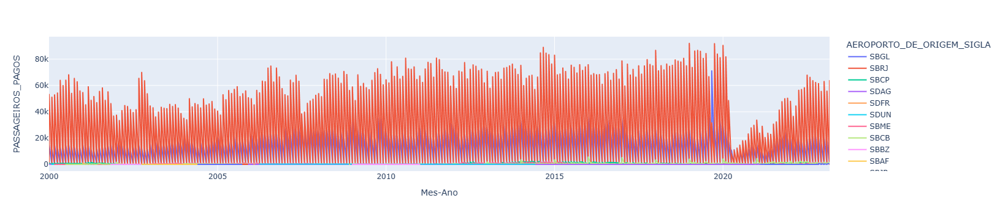

In [29]:
fig = px.line(BaseANAC_RJOrigem.groupby(["ANO","MES","Mes-Ano","PASSAGEIROS_PAGOS","AEROPORTO_DE_ORIGEM_SIGLA"], as_index=False)['PASSAGEIROS_PAGOS'].sum(), x="Mes-Ano", y="PASSAGEIROS_PAGOS", title="", color= "AEROPORTO_DE_ORIGEM_SIGLA")
fig.show()

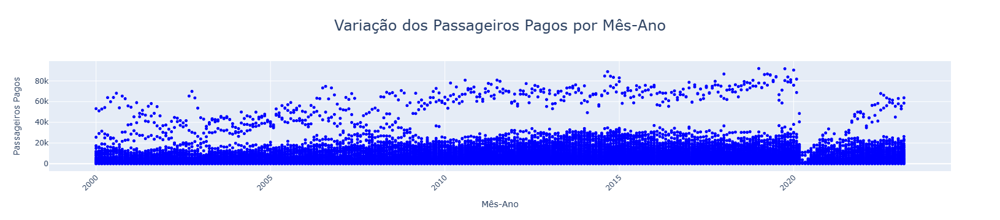

In [30]:
fig = px.scatter(BaseANAC_RJOrigem, x="Mes-Ano", y="PASSAGEIROS_PAGOS", 
                 title="Variação dos Passageiros Pagos por Mês-Ano",
                 labels={"PASSAGEIROS_PAGOS": "Passageiros Pagos", "Mes-Ano": "Mês-Ano"})

# Personalizar o estilo do gráfico
fig.update_traces(marker=dict(color='blue', size=5), line=dict(color='blue', width=2, dash='dot'))
fig.update_layout(title_font=dict(size=24), title_x=0.5)  # Ajusta o tamanho do título e centraliza
fig.update_xaxes(tickangle=-45)  # Rotaciona os rótulos do eixo x para melhor legibilidade

# Exibir o gráfico
fig.show()

## 2. BASE DOLAR

In [31]:
BaseDolar

,Data,Último,Abertura,Máxima,Mínima,Vol.,Var%
0,2023-05-01,4.9531,4.9875,5.0529,4.9250,NaN,-0.0067
1,2023-04-01,4.9865,5.0637,5.1002,4.8921,NaN,-0.0151
2,2023-03-01,5.0631,5.2369,5.3421,5.0547,NaN,-0.0332
3,2023-02-01,5.2367,5.0736,5.3092,4.9401,NaN,0.0322
4,2023-01-01,5.0731,5.2865,5.4802,5.0560,NaN,-0.0403
...,...,...,...,...,...,...,...
276,2000-05-01,1.8240,1.7990,1.8600,1.7960,NaN,0.0105
277,2000-04-01,1.8050,1.7360,1.8170,1.7360,NaN,0.0377
278,2000-03-01,1.7395,1.7675,1.7695,1.7085,NaN,-0.0161
279,2000-02-01,1.7680,1.7840,1.7990,1.7560,NaN,-0.0090


In [32]:
BaseDolar['Data'] = pd.to_datetime(BaseDolar['Data'])
#BaseDolar['Mes.Ano'] = BaseDolar['Data'].dt.strftime('%m-%Y').astype(str)


BaseDolar['Mes.Ano'] = BaseDolar['Data'].dt.month.astype(str) + '-' +BaseDolar['Data'].dt.year.astype(str)

In [33]:
#BaseDolar.set_index('Mes.Ano', inplace = True)
BaseDolar


,Data,Último,Abertura,Máxima,Mínima,Vol.,Var%,Mes.Ano
0,2023-05-01,4.9531,4.9875,5.0529,4.9250,NaN,-0.0067,5-2023
1,2023-04-01,4.9865,5.0637,5.1002,4.8921,NaN,-0.0151,4-2023
2,2023-03-01,5.0631,5.2369,5.3421,5.0547,NaN,-0.0332,3-2023
3,2023-02-01,5.2367,5.0736,5.3092,4.9401,NaN,0.0322,2-2023
4,2023-01-01,5.0731,5.2865,5.4802,5.0560,NaN,-0.0403,1-2023
...,...,...,...,...,...,...,...,...
276,2000-05-01,1.8240,1.7990,1.8600,1.7960,NaN,0.0105,5-2000
277,2000-04-01,1.8050,1.7360,1.8170,1.7360,NaN,0.0377,4-2000
278,2000-03-01,1.7395,1.7675,1.7695,1.7085,NaN,-0.0161,3-2000
279,2000-02-01,1.7680,1.7840,1.7990,1.7560,NaN,-0.0090,2-2000


In [34]:
BaseDolar.dtypes

Data        datetime64[ns]
Último             float64
Abertura           float64
Máxima             float64
Mínima             float64
Vol.               float64
Var%               float64
Mes.Ano             object
dtype: object

## 3. BASE IPCA

In [35]:
BaseIPAC["Mes.Ano"] = BaseIPAC['MÊS'].astype(str) + "-" + BaseIPAC['ANO'].astype(str) 

#BaseIPAC["Mes.Ano"] = BaseIPAC['ANO'].astype(str)  + '-' + BaseIPAC['MÊS'].astype(str)  +'-' + '1'

#pd.to_datetime(BaseIPAC["Mes.Ano"].timeStamp)

#BaseIPAC["Mes.Ano"].to_datetime(BaseIPAC["Mes.Ano"])

BaseIPAC


,Mes-Ano,ANO,MÊS,NÚMERO ÍNDICE,Mes.Ano
0,1994-01-01,1994,1,141.31,1-1994
1,1994-02-01,1994,2,198.22,2-1994
2,1994-03-01,1994,3,282.96,3-1994
3,1994-04-01,1994,4,403.73,4-1994
4,1994-05-01,1994,5,581.49,5-1994
...,...,...,...,...,...
346,2022-11-01,2022,11,6434.20,11-2022
347,2022-12-01,2022,12,6474.09,12-2022
348,2023-01-01,2023,1,6508.40,1-2023
349,2023-02-01,2023,2,6563.07,2-2023


In [36]:
BaseIPAC.dtypes

Mes-Ano          datetime64[ns]
ANO                       int64
MÊS                       int64
NÚMERO ÍNDICE           float64
Mes.Ano                  object
dtype: object

## 4. BASE DESEMPREGO E RENDA

In [37]:
BaseDesempRenda = BaseDesempRenda[['Data','DataFormat','População total',
                                    'Taxa de participação na força de trabalho das pessoas de 14 anos ou mais de idade, na semana de referência',
                                  'Rendimento médio de todos os trabalhos, efetivamente recebido no mês de referência, pelas pessoas de 14 anos ou mais de idade, ocupadas na semana de referência, com rendimento de trabalho'
                                  ]]


In [38]:
BaseDesempRenda = BaseDesempRenda.rename(columns={'DataFormat':'DataFormat','Taxa de participação na força de trabalho das pessoas de 14 anos ou mais de idade, na semana de referência': 'Taxa de Ocupação',  'Rendimento médio de todos os trabalhos, efetivamente recebido no mês de referência, pelas pessoas de 14 anos ou mais de idade, ocupadas na semana de referência, com rendimento de trabalho': 'Renda Média'})


BaseDesempRenda['Mes.Ano'] = BaseDesempRenda['DataFormat'].dt.year.astype(str) + '-' + BaseDesempRenda['DataFormat'].dt.month.astype(str) + '-01' 

In [39]:
BaseDesempRenda

,Data,DataFormat,População total,Taxa de Ocupação,Renda Média,Mes.Ano
0,2012-1-1,2012-01-01,196931,60.8,1506,2012-1-01
1,2012-2-1,2012-02-01,197074,61.2,1401,2012-2-01
2,2012-3-1,2012-03-01,197217,61.4,1472,2012-3-01
3,2012-4-1,2012-04-01,197359,61.9,1272,2012-4-01
4,2012-5-1,2012-05-01,197502,61.7,1399,2012-5-01
...,...,...,...,...,...,...
110,2021-3-1,2021-03-01,212169,56.8,2545,2021-3-01
111,2021-4-1,2021-04-01,212297,57.0,2322,2021-4-01
112,2021-5-1,2021-05-01,212426,58.0,2483,2021-5-01
113,2021-6-1,2021-06-01,212553,58.2,2501,2021-6-01


In [40]:
BaseDesempRenda2 = BaseDesempRenda2.rename(columns={'Taxa de desocupação - (%) - Instituto Brasileiro de Geografia e Estatística- Pesquisa Nacional por Amostra de Domicílios Contínua (IBGE/PNAD Contínua) - PNADC12_TDESOC12':'Taxa de Desocupação(%)',
                                                    'Rendimento médio de todos os trabalhos efetivos mensais - R$ - Instituto Brasileiro de Geografia e Estatística, Pesquisa Nacional por Amostra de Domicílios Contínua (IBGE/PNAD Contínua) - PNADC12_RTE12 - ':'Rend med trabalhos',
                                                    'Rendimento real médio do trabalho principal habitual mensal - R$ Penúltimo mês da série - Instituto Brasileiro de Geografia e Estatística, Pesquisa Nacional por Amostra de Domicílios Contínua (IBGE/PNAD Contínua) - PNADC12_RRPH12 - ':'Rend med trabalho princial'})

In [41]:
BaseDesempRenda2

,Data,Data2,Taxa de Desocupação(%),Rend med trabalhos,Rend med trabalho princial
0,2012-03-01,2012.03,8.0,1500.0,2673
1,2012-04-01,2012.04,7.8,1420.0,2685
2,2012-05-01,2012.05,7.7,1424.0,2678
3,2012-06-01,2012.06,7.6,1433.0,2684
4,2012-07-01,2012.07,7.5,1445.0,2697
...,...,...,...,...,...
131,2023-02-01,2023.02,8.6,NaN,2833
132,2023-03-01,2023.03,8.8,NaN,2841
133,2023-04-01,2023.04,8.5,NaN,2828
134,2023-05-01,2023.05,8.3,NaN,2825


# 5. Base Salário Minimo

In [42]:
BaseSalarioMinimo

,Data,Salário mínimo real - R$ (do último mês)
0,7.1940,1100.620395
1,8.1940,1097.547262
2,9.1940,1096.560358
3,10.1940,1079.397931
4,11.1940,1055.129942
...,...,...
988,11.2022,1243.323665
989,12.2022,1234.802657
990,1.2023,1320.421648
991,2.2023,1310.333036


In [43]:
BaseSalarioMinimo['Mes.Ano'] = BaseSalarioMinimo['Data']

In [44]:
BaseSalarioMinimo

,Data,Salário mínimo real - R$ (do último mês),Mes.Ano
0,7.1940,1100.620395,7.1940
1,8.1940,1097.547262,8.1940
2,9.1940,1096.560358,9.1940
3,10.1940,1079.397931,10.1940
4,11.1940,1055.129942,11.1940
...,...,...,...
988,11.2022,1243.323665,11.2022
989,12.2022,1234.802657,12.2022
990,1.2023,1320.421648,1.2023
991,2.2023,1310.333036,2.2023


# 6. Base Selic

In [45]:
BaseSelic.head()


,Data,Mes,Ano,Taxa de juros - Selic - fixada pelo Copom - (% a.a.) - Banco Central do Brasil- Boletim- Seção mercado financeiro e de capitais (Bacen/Boletim/M. Finan.) - BM366_TJOVER366
0,1996-07-01,7,1996,253401.0
1,1996-08-01,8,1996,253401.0
2,1996-09-01,9,1996,250453.0
3,1996-10-01,10,1996,241644.0
4,1996-11-01,11,1996,235803.0


In [46]:
BaseSelic.dtypes

Data                                                                                                                                                                           datetime64[ns]
Mes                                                                                                                                                                                     int64
Ano                                                                                                                                                                                     int64
Taxa de juros - Selic - fixada pelo Copom - (% a.a.) - Banco Central do Brasil- Boletim- Seção mercado financeiro e de capitais (Bacen/Boletim/M. Finan.) - BM366_TJOVER366           float64
dtype: object

In [47]:
BaseSelic.rename(columns={'Taxa de juros - Selic - fixada pelo Copom - (% a.a.) - Banco Central do Brasil- Boletim- Seção mercado financeiro e de capitais (Bacen/Boletim/M. Finan.) - BM366_TJOVER366': "Taxa de Juros - Selic"},inplace = True)

BaseSelic['Mes.Ano'] = BaseSelic['Data'].dt.month.astype(str) + '-' + BaseSelic['Data'].dt.year.astype(str)
BaseSelic.head()


,Data,Mes,Ano,Taxa de Juros - Selic,Mes.Ano
0,1996-07-01,7,1996,253401.0,7-1996
1,1996-08-01,8,1996,253401.0,8-1996
2,1996-09-01,9,1996,250453.0,9-1996
3,1996-10-01,10,1996,241644.0,10-1996
4,1996-11-01,11,1996,235803.0,11-1996


# 7. Base Tarifas

Detalhamento: https://www.anac.gov.br/acesso-a-informacao/dados-abertos/areas-de-atuacao/voos-e-operacoes-aereas/tarifas-aereas-domesticas/46-tarifas-aereas-domesticas

In [48]:
#BaseTarifa['ANO'].fillna(method='ffill', inplace=True)
BaseTarifa['ANO'] = BaseTarifa['ANO'].astype(int)
BaseTarifa = BaseTarifa.round(2)
BaseTarifa

,Data,ANO,MES,ASSENTOS,TARIFA
0,2002-01-01,2002,1,1312446.0,303.12
1,2002-02-01,2002,2,1150345.0,302.38
2,2002-03-01,2002,3,1226532.0,284.98
3,2002-04-01,2002,4,1158974.0,305.82
4,2002-05-01,2002,5,1139840.0,274.67
...,...,...,...,...,...
250,2022-11-01,2022,11,2456623.0,940.08
251,2022-12-01,2022,12,1826543.0,952.67
252,2023-01-01,2023,1,2488754.0,895.37
253,2023-02-01,2023,2,2006356.0,877.88


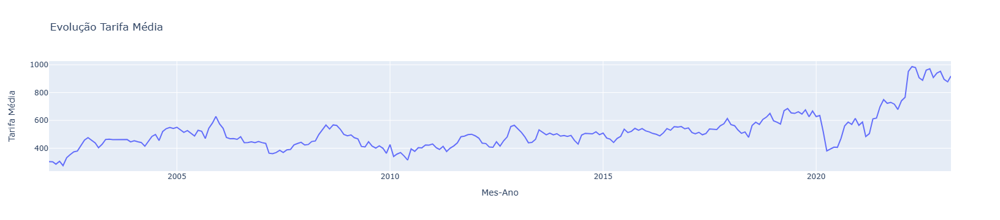

In [49]:
fig = px.line(BaseTarifa[["Data","TARIFA"]], x="Data", y="TARIFA", labels={'Data':'Mes-Ano', 'TARIFA':'Tarifa Média'}, title='Evolução Tarifa Média')

fig.show()

In [50]:
BaseTarifa[BaseTarifa['TARIFA'] == 'NaN']

,Data,ANO,MES,ASSENTOS,TARIFA


# Bases ICMS

In [51]:
ICMS_Brasil = ICMS_Brasil.rename(columns={'Imposto sobre a circulação de mercadorias (ICMS) - Brasil - R$ - Ministério da Economia, Sistema de Informação Contábeis e Fiscais do Setor Público Brasileiro (Min. Economia/Siconfi) - CONFAZ12_ICMSN12':'ICMS Brasil'})
ICMS_Brasil = ICMS_Brasil[['Data','DataFormat','ICMS Brasil']]


ICMS_Brasil

,Data,DataFormat,ICMS Brasil
0,01/01/1980,01/01/1980,"0,00"
1,01/02/1980,01/02/1980,"0,00"
2,01/03/1980,01/03/1980,"0,00"
3,01/04/1980,01/04/1980,"0,00"
4,01/05/1980,01/05/1980,"0,00"
...,...,...,...
515,01/12/2022,01/12/2022,"57.256.483,00"
516,01/01/2023,01/01/2023,"55.887.941,00"
517,01/02/2023,01/02/2023,"50.394.816,00"
518,01/03/2023,01/03/2023,"53.368.307,00"


In [52]:
ICMS_Brasil['Data'] = pd.to_datetime(ICMS_Brasil['Data'], format='%d/%m/%Y')


In [53]:
ICMS_Brasil['Mes.Ano'] = ICMS_Brasil['Data'].dt.year.astype(str) + '-' + ICMS_Brasil['Data'].dt.month.astype(str) + '-01'

In [54]:
ICMS_Brasil

,Data,DataFormat,ICMS Brasil,Mes.Ano
0,1980-01-01,01/01/1980,"0,00",1980-1-01
1,1980-02-01,01/02/1980,"0,00",1980-2-01
2,1980-03-01,01/03/1980,"0,00",1980-3-01
3,1980-04-01,01/04/1980,"0,00",1980-4-01
4,1980-05-01,01/05/1980,"0,00",1980-5-01
...,...,...,...,...
515,2022-12-01,01/12/2022,"57.256.483,00",2022-12-01
516,2023-01-01,01/01/2023,"55.887.941,00",2023-1-01
517,2023-02-01,01/02/2023,"50.394.816,00",2023-2-01
518,2023-03-01,01/03/2023,"53.368.307,00",2023-3-01


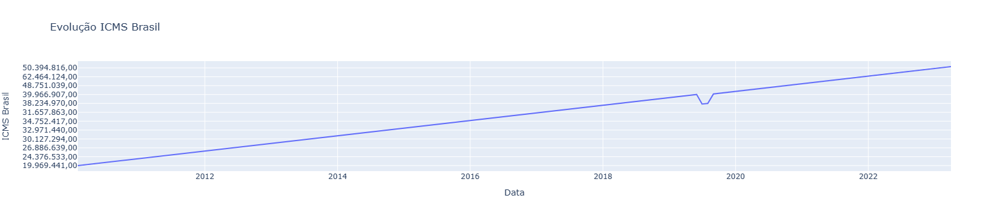

In [55]:
fig = px.line(ICMS_Brasil[ICMS_Brasil["Data"]>"2010-01-01"].reset_index(), x="Data", y="ICMS Brasil", title='Evolução ICMS Brasil')
fig.show()

In [56]:
ICMS_RJ = ICMS_RJ.rename(columns={'Imposto sobre a circulação de mercadorias (ICMS) - Rio de Janeiro (RJ) - R$ - Ministério da Economia, Sistema de Informação Contábeis e Fiscais do Setor Público Brasileiro (Min. Economia/Siconfi) - CONFAZ12_ICMSRJ12':'ICMS RJ'})
ICMS_RJ = ICMS_RJ[['Data','ICMS RJ']]
ICMS_RJ['Data'] = ICMS_RJ['Data'].replace('/','-')

ICMS_RJ

,Data,ICMS RJ
0,01/01/1993,3345.768
1,01/02/1993,3671.141
2,01/03/1993,4599.264
3,01/04/1993,6288.473
4,01/05/1993,7565.161
...,...,...
359,01/12/2022,3800776.211
360,01/01/2023,4196102.843
361,01/02/2023,3586171.749
362,01/03/2023,3958302.110


In [57]:
ICMS_Brasil.dtypes

Data           datetime64[ns]
DataFormat             object
ICMS Brasil            object
Mes.Ano                object
dtype: object

# Base Consolidada

In [58]:
#BaseANAC_AnoMes = BaseANAC.groupby(["ano","mes"], as_index=False)['assentos_vendidos'].sum()
#BaseANAC_AnoMes["Mes.Ano"] = BaseANAC_AnoMes['mes'].astype(str) + "-" + BaseANAC_AnoMes['ano'].astype(str)
#BaseANAC_AnoMes = BaseANAC_AnoMes.to_frame()
                                                  
            
#BaseANAC_AnoMes

In [59]:
BaseANACgov2 = BaseANACgov2.set_index('Mes-Ano')
BaseANACgov2

,ANO,MES,PASSAGEIROS_PAGOS
Mes-Ano,,,
2000-01-01,2000,1,3351571.0
2000-02-01,2000,2,2919936.0
2000-03-01,2000,3,3170764.0
2000-04-01,2000,4,3106148.0
2000-05-01,2000,5,2965231.0
...,...,...,...
2022-11-01,2022,11,8860265.0
2022-12-01,2022,12,9339419.0
2023-01-01,2023,1,10180464.0


In [60]:
BaseConsolidada = BaseANACgov2.join(BaseIPAC[['Mes-Ano','NÚMERO ÍNDICE']].set_index('Mes-Ano'))
BaseConsolidada = BaseConsolidada.join(BaseDolar[['Data','Último']].set_index('Data'))
BaseConsolidada = BaseConsolidada.join(BaseSelic[['Data','Taxa de Juros - Selic']].set_index('Data'))
BaseConsolidada = BaseConsolidada.join(BaseTarifa[['Data','TARIFA']].set_index('Data'))
#BaseConsolidada = BaseConsolidada.join(ICMS_Brasil[['Data','ICMS Brasil']].set_index('Data'))


#BaseConsolidada = BaseConsolidada.join(BaseDesempRenda[['Mes.Ano','Renda Média']].set_index('Mes.Ano'))
#BaseConsolidada

In [61]:
BaseConsolidada2 = BaseANACgov2.join(BaseIPAC[['Mes-Ano','NÚMERO ÍNDICE']].set_index('Mes-Ano'))
BaseConsolidada2 = BaseConsolidada2.join(BaseDolar[['Data','Último']].set_index('Data'))
BaseConsolidada2 = BaseConsolidada2.join(BaseSelic[['Data','Taxa de Juros - Selic']].set_index('Data'))
BaseConsolidada2 = BaseConsolidada2.join(BaseTarifa[['Data','TARIFA']].set_index('Data'))
BaseConsolidada2 = BaseConsolidada2.join(BaseDesempRenda2[['Data','Taxa de Desocupação(%)','Rend med trabalho princial']].set_index('Data'))


In [62]:
#BaseConsolidada.sort_values(["ano","mes"])
BaseConsolidada2.rename(columns={'PASSAGEIROS_PAGOS':'TotalPassageiros','NÚMERO ÍNDICE':"Índice IPCA", "Último":"Dolar", "TARIFA":"Tarifa Média","Renda Média":"Renda Média","Taxa de Ocupação":"Taxa de Ocupação"}, inplace = True)
BaseConsolidada2 = BaseConsolidada2[BaseConsolidada2['ANO'] > 2012]
BaseConsolidada2

,ANO,MES,TotalPassageiros,Índice IPCA,Dolar,Taxa de Juros - Selic,Tarifa Média,Taxa de Desocupação(%),Rend med trabalho princial
Mes-Ano,,,,,,,,,
2013-01-01,2013,1,9771200.0,3633.44,1.9902,7.25,537.22,7.3,2699.0
2013-02-01,2013,2,7913824.0,3655.24,1.9795,7.25,512.55,7.8,2716.0
2013-03-01,2013,3,8702291.0,3672.42,2.0235,7.25,482.12,8.1,2736.0
2013-04-01,2013,4,8583971.0,3692.62,2.0010,7.25,438.95,7.9,2742.0
2013-05-01,2013,5,8856742.0,3706.28,2.1418,7.50,441.59,7.7,2744.0
...,...,...,...,...,...,...,...,...,...
2022-11-01,2022,11,8860265.0,6434.20,5.1851,13.75,940.08,8.1,2813.0
2022-12-01,2022,12,9339419.0,6474.09,5.2860,13.75,952.67,7.9,2819.0
2023-01-01,2023,1,10180464.0,6508.40,5.0731,13.75,895.37,8.4,2831.0


In [63]:
BaseConsolidada3 = BaseConsolidada2[BaseConsolidada2['ANO'] != 2020]


In [64]:
#print(tabulate(BaseConsolidada[:5], headers='keys', tablefmt='pretty'))

In [65]:
# Assuming BaseConsolidada is the DataFrame containing the 'ICMS Brasil' column
#BaseConsolidada['ICMS Brasil'] = BaseConsolidada['ICMS Brasil'].str.strip()  # Remove leading and trailing whitespace
#BaseConsolidada['ICMS Brasil'] = BaseConsolidada['ICMS Brasil'].str.replace('.', '')  # Remove thousands separators
#BaseConsolidada['ICMS Brasil'] = BaseConsolidada['ICMS Brasil'].astype(float)  # Convert to float

In [66]:
BaseConsolidada2.dtypes

ANO                             int64
MES                             int64
TotalPassageiros              float64
Índice IPCA                   float64
Dolar                         float64
Taxa de Juros - Selic         float64
Tarifa Média                  float64
Taxa de Desocupação(%)        float64
Rend med trabalho princial    float64
dtype: object

In [67]:
BaseConsolidada2.columns

Index(['ANO', 'MES', 'TotalPassageiros', 'Índice IPCA', 'Dolar',
       'Taxa de Juros - Selic', 'Tarifa Média', 'Taxa de Desocupação(%)',
       'Rend med trabalho princial'],
      dtype='object')

In [68]:
#BaseConsolidada['Mes-Ano'] = pd.to_datetime(BaseConsolidada['Mes-Ano'])
#BaseConsolidada = BaseConsolidada.set_index('Mes-Ano')
#BaseConsolidada = BaseConsolidada[['Mes-Ano','assentos_vendidos','NÚMERO ÍNDICE']]

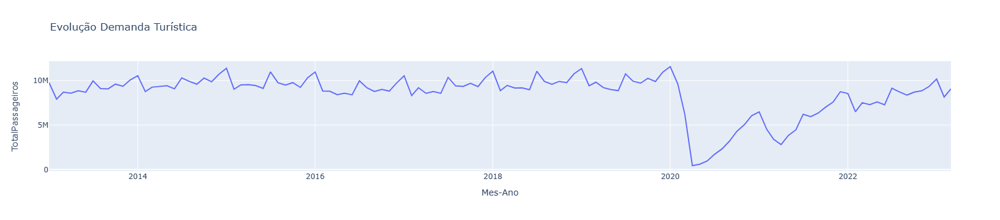

In [69]:
#BaseConsolidada['assentos_vendidos'].plot(figsize=(12,8))

fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="TotalPassageiros", title='Evolução Demanda Turística')
fig.show()


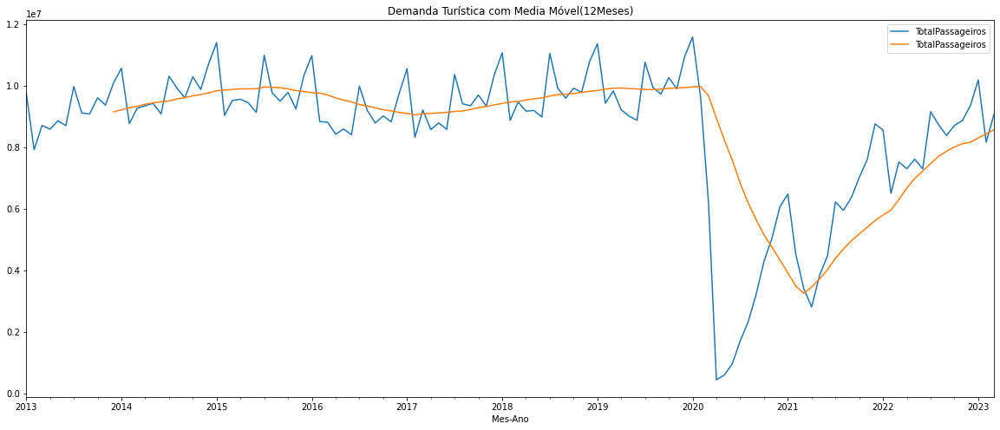

In [70]:
BaseConsolidada2 = BaseConsolidada2.reset_index()
moving_avg = BaseConsolidada2[["Mes-Ano","TotalPassageiros"]].set_index('Mes-Ano').rolling(window=12, center=False).mean()

fig, ax = plt.subplots(figsize=(20,8))
ax.set_title('Demanda Turística com Media Móvel(12Meses)')
BaseConsolidada2[["Mes-Ano","TotalPassageiros"]].set_index("Mes-Ano").plot(ax=ax, label = "Total de Passageiros")
moving_avg.plot(ax=ax, label = "Média Móvel")
ax.legend()
plt.show()

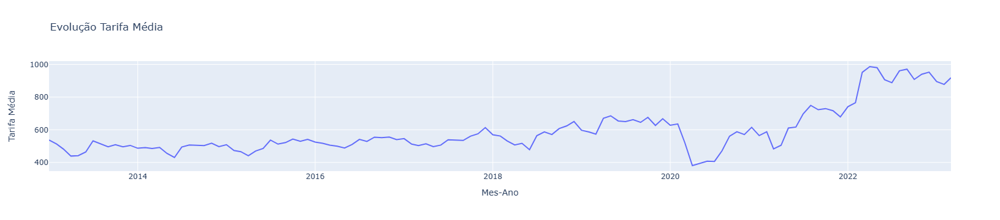

In [71]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Tarifa Média", title='Evolução Tarifa Média')

fig.show()


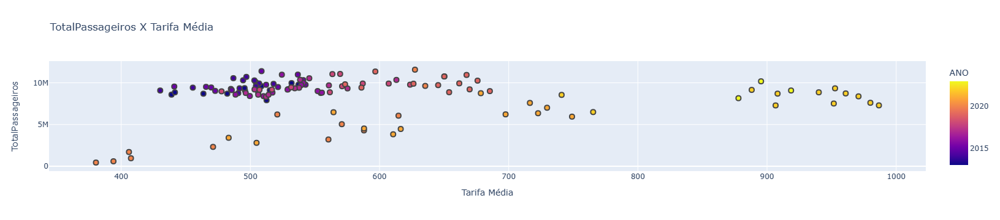

In [72]:
fig  = px.scatter(BaseConsolidada2, x = 'Tarifa Média', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X Tarifa Média')
fig.update_traces(marker = dict(size=8, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()


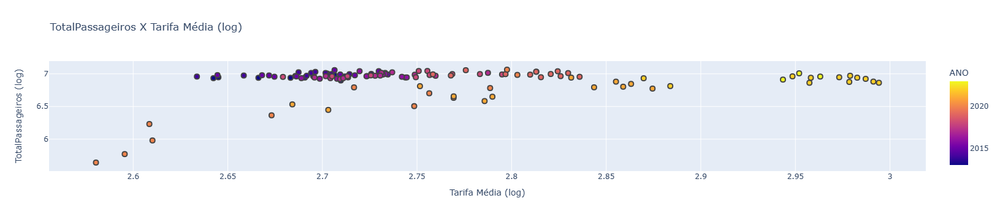

In [73]:
# Aplicando o logaritmo de base 10 às variáveis
BaseConsolidada2['Tarifa Média (log)'] = np.log10(BaseConsolidada2['Tarifa Média'])
BaseConsolidada2['TotalPassageiros (log)'] = np.log10(BaseConsolidada2['TotalPassageiros'])

fig = px.scatter(BaseConsolidada2, x='Tarifa Média (log)', y='TotalPassageiros (log)', color='ANO', title='TotalPassageiros X Tarifa Média (log)')
fig.update_traces(marker=dict(size=8, line=dict(width=2)))

fig.show()


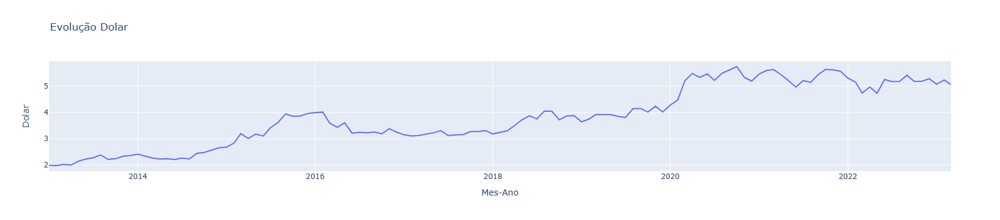

In [74]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Dolar", title='Evolução Dolar')

fig.show()


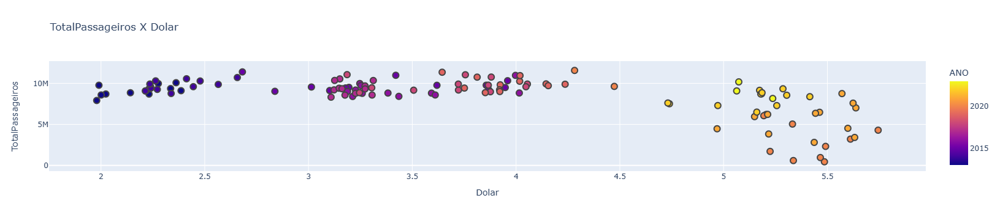

In [75]:
fig  = px.scatter(BaseConsolidada2, x = 'Dolar', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X Dolar')
fig.update_traces(marker = dict(size=10, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()


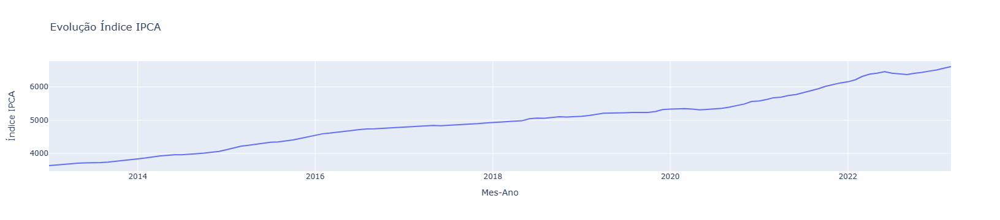

In [76]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Índice IPCA", title='Evolução Índice IPCA')

fig.show()


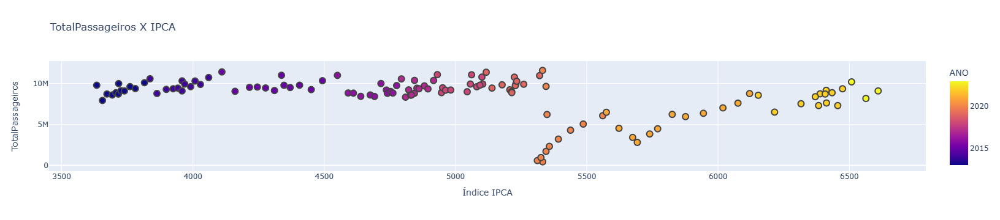

In [77]:
fig  = px.scatter(BaseConsolidada2, x = 'Índice IPCA', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X IPCA')
fig.update_traces(marker = dict(size=10, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()


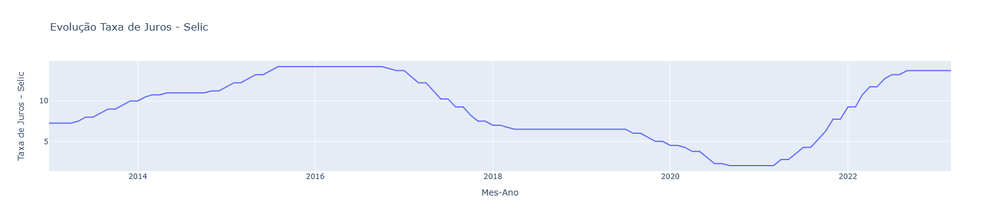

In [78]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Taxa de Juros - Selic", title='Evolução Taxa de Juros - Selic')

fig.show()


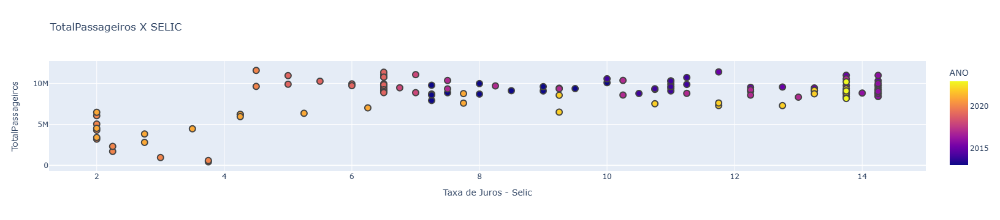

In [79]:
fig  = px.scatter(BaseConsolidada2, x = 'Taxa de Juros - Selic', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X SELIC')
fig.update_traces(marker = dict(size=10, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()

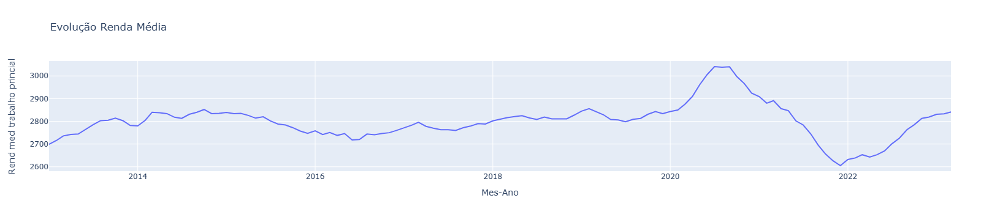

In [80]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Rend med trabalho princial", title='Evolução Renda Média')

fig.show()


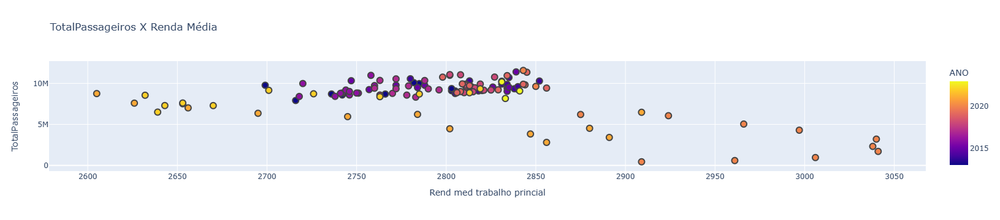

In [81]:
fig  = px.scatter(BaseConsolidada2, x = 'Rend med trabalho princial', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X Renda Média')
fig.update_traces(marker = dict(size=10, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()

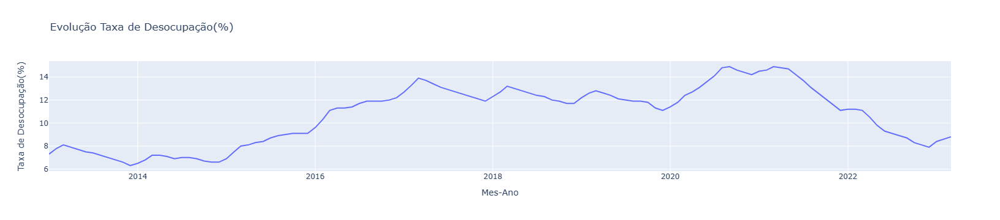

In [82]:
fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="Taxa de Desocupação(%)", title='Evolução Taxa de Desocupação(%)')

fig.show()


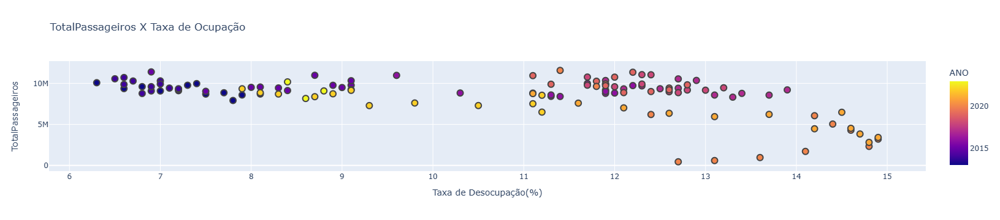

In [83]:
fig  = px.scatter(BaseConsolidada2, x = 'Taxa de Desocupação(%)', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X Taxa de Ocupação')
fig.update_traces(marker = dict(size=10, line = dict(width=2)),selector=dict(mode = 'markers'))

fig.show()

In [84]:
#fig = px.line(BaseConsolidada2.reset_index(), x="Mes-Ano", y="ICMS Brasil", title='Evolução Arrecadação ICMS')

#fig.show()

In [85]:
#fig  = px.scatter(BaseConsolidada2, x = 'ICMS Brasil', y = 'TotalPassageiros', color = 'ANO' ,width = 100, title='TotalPassageiros X ICMS')
#fig.update_traces(marker = dict(size=7, line = dict(width=2)),selector=dict(mode = 'markers'))

#fig.show()

## Analisando Correlação e Teste de Causalidade

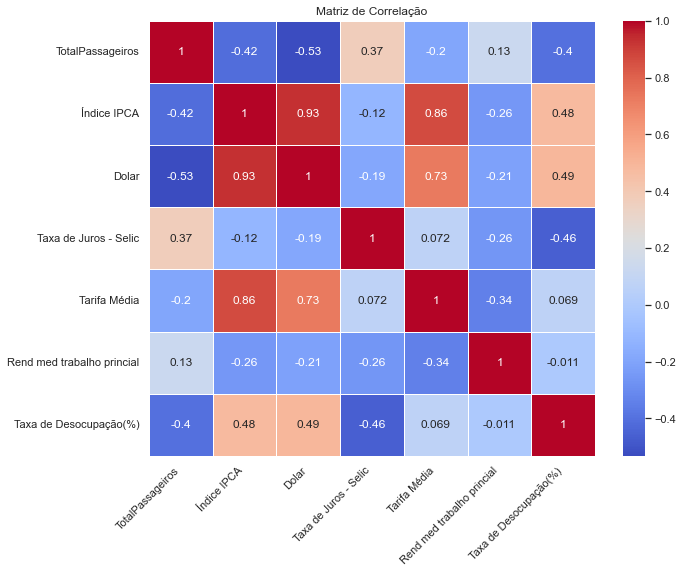

In [86]:
# Calcule a matriz de correlação
correlation_matrix = BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']].corr()
correlation_matrix = correlation_matrix.iloc[:, :]
sns.set(style="white")
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5, ax=ax)
ax.set_title("Matriz de Correlação")
plt.xticks(rotation=45, ha='right')

plt.show()


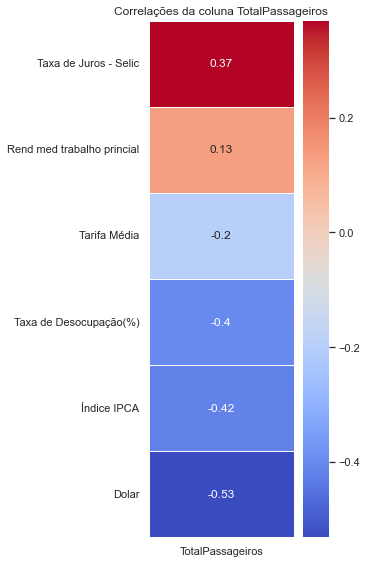

In [87]:
correlation_matrix = BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']].corr()
correlation_matrix = correlation_matrix.iloc[:, :]

# Selecione as correlações com a coluna de interesse
correlations = correlation_matrix['TotalPassageiros'].drop('TotalPassageiros').sort_values(ascending=False)


# Crie uma figura e um eixo para o gráfico de barras
fig, ax = plt.subplots(figsize=(5, 8))

# Use o seaborn para plotar um gráfico de barras das correlações
heatmap_data = pd.DataFrame({'TotalPassageiros': correlations})
# Use o seaborn para plotar o mapa de calor
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", linewidths=0.5, ax=ax)

# Defina o título e rótulos dos eixos
ax.set_title(f"Correlações da coluna TotalPassageiros")

# Ajuste a rotação dos rótulos dos eixos x
plt.xticks(rotation=0, ha='center')

# Exiba o gráfico de barras
plt.tight_layout()
plt.show()

In [88]:
BaseConsolidada3[['Índice IPCA', 'Taxa de Juros - Selic']].corr()

,Índice IPCA,Taxa de Juros - Selic
Índice IPCA,1.000000,-0.115669
Taxa de Juros - Selic,-0.115669,1.000000


In [89]:
BaseConsolidada2.columns

Index(['Mes-Ano', 'ANO', 'MES', 'TotalPassageiros', 'Índice IPCA', 'Dolar',
       'Taxa de Juros - Selic', 'Tarifa Média', 'Taxa de Desocupação(%)',
       'Rend med trabalho princial', 'Tarifa Média (log)',
       'TotalPassageiros (log)'],
      dtype='object')

In [90]:
BaseConsolidada2 = BaseConsolidada2[BaseConsolidada2['ANO']<2023]

In [91]:
BaseConsolidada3 = BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']]

In [92]:
BaseConsolidada3

,TotalPassageiros,Índice IPCA,Dolar,Taxa de Juros - Selic,Tarifa Média,Taxa de Desocupação(%),Rend med trabalho princial
Mes-Ano,,,,,,,
2013-01-01,9771200.0,3633.44,1.9902,7.25,537.22,7.3,2699.0
2013-02-01,7913824.0,3655.24,1.9795,7.25,512.55,7.8,2716.0
2013-03-01,8702291.0,3672.42,2.0235,7.25,482.12,8.1,2736.0
2013-04-01,8583971.0,3692.62,2.0010,7.25,438.95,7.9,2742.0
2013-05-01,8856742.0,3706.28,2.1418,7.50,441.59,7.7,2744.0
...,...,...,...,...,...,...,...
2022-11-01,8860265.0,6434.20,5.1851,13.75,940.08,8.1,2813.0
2022-12-01,9339419.0,6474.09,5.2860,13.75,952.67,7.9,2819.0
2023-01-01,10180464.0,6508.40,5.0731,13.75,895.37,8.4,2831.0


In [90]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=1

def grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False):
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

def ImprimeGT(data):
    variables=data.columns
    df = grangers_causation_matrix(data, variables, test='ssr_chi2test', verbose=False)
    print(grangers_causation_matrix(df, variables=df.columns))
    return

ImprimeGT(BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']])

                                TotalPassageiros_x_x  Índice IPCA_x_x  \
TotalPassageiros_x_y                          1.0000           0.0000   
Índice IPCA_x_y                               0.0000           1.0000   
Dolar_x_y                                     0.5890           0.0000   
Taxa de Juros - Selic_x_y                     0.4173           0.7607   
Tarifa Média_x_y                              0.3363           0.9566   
Taxa de Desocupação(%)_x_y                    0.8346           0.2292   
Rend med trabalho princial_x_y                0.1294           0.9223   

                                Dolar_x_x  Taxa de Juros - Selic_x_x  \
TotalPassageiros_x_y               0.9736                     0.5485   
Índice IPCA_x_y                    0.7280                     0.0036   
Dolar_x_y                          1.0000                     0.3132   
Taxa de Juros - Selic_x_y          0.0000                     1.0000   
Tarifa Média_x_y                   0.0571              

## Verificando se cada série é estacionaria

In [94]:
from statsmodels.tsa.stattools import adfuller
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue']
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")

In [95]:
# ADF Test on each column
for name, column in BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']].iteritems():
    adfuller_test(column, name=column.name)
    print('\n') 

    Augmented Dickey-Fuller Test on "TotalPassageiros" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.8548
 No. Lags Chosen       = 12
 Critical value 1%     = -3.499
 Critical value 5%     = -2.892
 Critical value 10%    = -2.583
 => P-Value = 0.0509. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Índice IPCA" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = 1.1452
 No. Lags Chosen       = 1
 Critical value 1%     = -3.492
 Critical value 5%     = -2.888
 Critical value 10%    = -2.581
 => P-Value = 0.9956. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "Dolar" 
    -----------------------------------------------
 Null Hypothes

In [96]:
# 1st difference
df_differenced = BaseConsolidada3.diff().dropna()

In [97]:
#df_differenced['Taxa de Juros - Selic'] = df_differenced['Taxa de Juros - Selic'].diff().dropna()

df_differenced2 = df_differenced.diff().dropna()

In [98]:
# ADF Test on each column
for name, column in df_differenced2[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']].iteritems():
    adfuller_test(column, name=column.name)
    print('\n') 

    Augmented Dickey-Fuller Test on "TotalPassageiros" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -4.164
 No. Lags Chosen       = 12
 Critical value 1%     = -3.5
 Critical value 5%     = -2.892
 Critical value 10%    = -2.583
 => P-Value = 0.0008. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Índice IPCA" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.3226
 No. Lags Chosen       = 7
 Critical value 1%     = -3.497
 Critical value 5%     = -2.891
 Critical value 10%    = -2.582
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "Dolar" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Signific

In [99]:
from statsmodels.tsa.api import VAR

model = VAR(df_differenced2)
for i in [1,2,3,4,5,6,7,8,9,10,11,12]:
    result = model.fit(i)
    print('Lag Order =', i)
    print('AIC : ', result.aic)
    print('BIC : ', result.bic)
    print('FPE : ', result.fpe)
    print('HQIC: ', result.hqic, '\n')

Lag Order = 1
AIC :  41.12474201580517
BIC :  42.51547672616587
FPE :  7.262313439804687e+17
HQIC:  41.68863442717906 

Lag Order = 2
AIC :  40.70011004247393
BIC :  43.32297945946926
FPE :  4.80267912349966e+17
HQIC:  41.76338642780015 

Lag Order = 3
AIC :  40.356684264286756
BIC :  44.22620898592126
FPE :  3.509843893012807e+17
HQIC:  41.92502368998935 

Lag Order = 4
AIC :  40.28953249976498
BIC :  45.420522510069524
FPE :  3.485684610587639e+17
HQIC:  42.368710875020035 

Lag Order = 5
AIC :  39.861237278401745
BIC :  46.26879984170584
FPE :  2.524593029702327e+17
HQIC:  42.45712917792534 

Lag Order = 6
AIC :  39.8094599610097
BIC :  47.50900778098175
FPE :  2.8453543234588662e+17
HQIC:  42.92804046012006 

Lag Order = 7
AIC :  39.204703416792775
BIC :  48.2119630702192
FPE :  2.0268226173680042e+17
HQIC:  42.85204993558507 

Lag Order = 8
AIC :  38.74096767792073
BIC :  49.07198833356095
FPE :  1.905736964498742e+17
HQIC:  42.923261830933555 

Lag Order = 9
AIC :  38.74239561350

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



Conclusão:
Menor AIC: 28,4
Correspondente a: Lag order = 12
Portanto a ordem utilizada para o VAR será 12.

In [100]:
#Define a ordem do modelo
lag_order = 12

model_fitted = model.fit(lag_order)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Sep, 2023
Time:                     10:40:33
--------------------------------------------------------------------
No. of Equations:         7.00000    BIC:                    44.2165
Nobs:                     97.0000    HQIC:                   34.8092
Log likelihood:          -1746.98    FPE:                1.91557e+15
AIC:                      28.4231    Det(Omega_mle):     2.33992e+13
--------------------------------------------------------------------
Results for equation TotalPassageiros
                                    coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------------
const                               2331.415194     52855.609445            0.044           0.965
L1.TotalPassageiros                   -1.518245         0.526643           -2.8

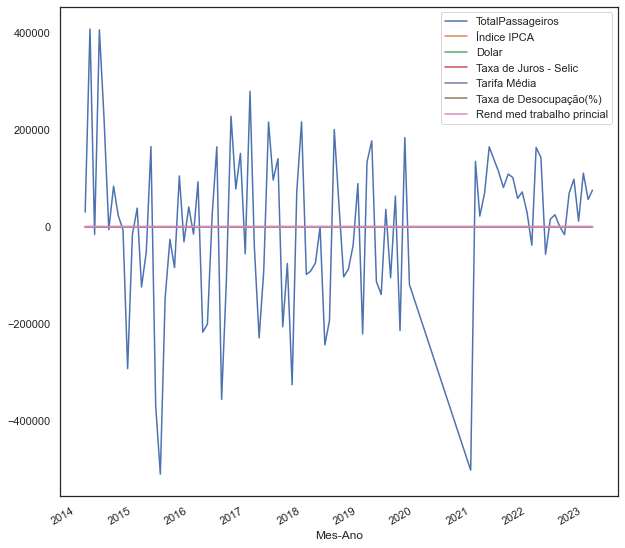

In [101]:
from pandas import DataFrame
# line plot of residuals
residuals = DataFrame(model_fitted.resid)
residuals.plot(figsize = (10,10))
plt.show()


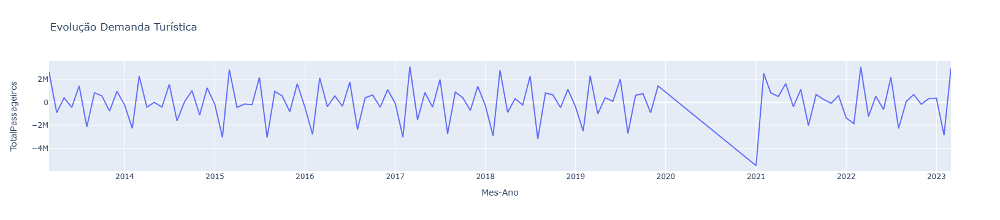

In [101]:
fig = px.line(df_differenced2.reset_index(), x="Mes-Ano", y="TotalPassageiros", title='Evolução Demanda Turística')
fig.show()

In [154]:
#Teste de Durbin Watson
from statsmodels.stats.stattools import durbin_watson
def adjust(val, length= 6): return str(val).ljust(length)
out = durbin_watson(model_fitted.resid)

for col, val in zip(BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Taxa de Desocupação(%)','Rend med trabalho princial']].columns, out):
    print(adjust(col), ':', round(val, 2))

TotalPassageiros : 1.76
Índice IPCA : 2.1
Dolar  : 1.86
Taxa de Juros - Selic : 2.13
Tarifa Média : 1.81
Taxa de Desocupação(%) : 2.04
Rend med trabalho princial : 2.38


Conclusão do teste de Durbin Watson
Como todas as estatísticas foram próximas a 2, não há correlação entre os erros da série

In [146]:
#Fazendo Previsões
forecast_input = df_differenced2.values[-lag_order:]
forecast_input

array([[-1.24357600e+06, -3.37400000e+01,  6.54000000e-01,
        -5.00000000e-01, -1.51360000e+02, -5.00000000e-01,
        -2.40000000e+01],
       [ 5.32796000e+05, -3.69500000e+01, -4.73700000e-01,
        -1.00000000e+00, -4.15500000e+01, -1.00000000e-01,
         2.00000000e+01],
       [-6.28298000e+05,  1.29700000e+01,  7.65300000e-01,
         1.00000000e+00, -6.67600000e+01,  2.00000000e-01,
         7.00000000e+00],
       [ 2.17874200e+06, -8.68700000e+01, -6.07500000e-01,
        -5.00000000e-01,  5.48600000e+01,  3.00000000e-01,
         1.40000000e+01],
       [-2.28406800e+06,  2.08200000e+01,  9.25000000e-02,
        -5.00000000e-01,  9.12900000e+01,  1.77635684e-15,
        -6.00000000e+00],
       [ 7.07720000e+04,  4.55000000e+00,  2.22600000e-01,
         5.00000000e-01, -6.28600000e+01, -1.77635684e-15,
         1.20000000e+01],
       [ 6.77887000e+05,  5.61200000e+01, -4.68600000e-01,
        -5.00000000e-01, -7.25800000e+01, -2.00000000e-01,
        -1.5000000

In [149]:
nobs = 24
fc = model_fitted.forecast(y=forecast_input, steps=nobs)
df_forecast = pd.DataFrame(fc, index=BaseConsolidada3.index[-nobs:], columns=BaseConsolidada3.columns + '_1d')
df_forecast

,TotalPassageiros_1d,Índice IPCA_1d,Dolar_1d,Taxa de Juros - Selic_1d,Tarifa Média_1d,Taxa de Desocupação(%)_1d,Rend med trabalho princial_1d
Mes-Ano,,,,,,,
2021-04-01,-4.874996e+06,104.854042,0.767989,0.185875,-221.558786,1.064994,30.333322
2021-05-01,5.760339e+06,-256.248128,-1.073286,1.063554,308.705818,-2.308885,-51.726968
2021-06-01,-3.359542e+06,161.652499,0.598545,-2.200365,-235.016067,2.222071,122.109621
2021-07-01,2.726773e+06,12.885497,-0.503985,3.463623,35.111497,-1.405486,-181.697998
2021-08-01,-8.456535e+04,-0.044453,0.380917,-3.273021,157.445835,0.098592,108.749974
2021-09-01,-3.214023e+06,58.109777,0.846540,-0.134519,-67.399350,1.126168,14.347193
2021-10-01,2.274691e+06,-155.088728,-1.262196,3.713558,23.707932,-2.296843,-110.619510
2021-11-01,2.542799e+06,-75.883118,-0.158441,-3.415508,-35.649054,0.961547,95.596182
2021-12-01,-3.101592e+06,123.130589,0.844004,-0.301496,-61.000314,1.006712,28.349265


In [150]:
#Transformando as previsões para a escala original
def invert_transformation(df_train, df_forecast, second_diff=False):
    """Revert back the differencing to get the forecast to original scale."""
    df_fc = df_forecast.copy()
    columns = df_train.columns
    for col in columns:        
        # Roll back 2nd Diff
        if second_diff:
            df_fc[str(col)+'_1d'] = (df_train[col].iloc[-1]-df_train[col].iloc[-2]) + df_fc[str(col)+'_2d'].cumsum()
        # Roll back 1st Diff
        df_fc[str(col)+'_forecast'] = df_train[col].iloc[-1] + df_fc[str(col)+'_1d'].cumsum()
    return df_fc

In [151]:
df_results = invert_transformation(BaseConsolidada3, df_forecast, second_diff=False)        
df_results = df_results.drop(columns=['TotalPassageiros_1d','Índice IPCA_1d','Dolar_1d','Taxa de Juros - Selic_1d','Tarifa Média_1d','Taxa de Desocupação(%)_1d','Rend med trabalho princial_1d'])
df_results


,TotalPassageiros_forecast,Índice IPCA_forecast,Dolar_forecast,Taxa de Juros - Selic_forecast,Tarifa Média_forecast,Taxa de Desocupação(%)_forecast,Rend med trabalho princial_forecast
Mes-Ano,,,,,,,
2021-04-01,4.203501e+06,6714.524042,5.831089,13.935875,697.061214,9.864994,2871.333322
2021-05-01,9.963839e+06,6458.275914,4.757803,14.999429,1005.767032,7.556109,2819.606354
2021-06-01,6.604298e+06,6619.928413,5.356348,12.799064,770.750965,9.778179,2941.715975
2021-07-01,9.331071e+06,6632.813910,4.852363,16.262687,805.862462,8.372694,2760.017976
2021-08-01,9.246506e+06,6632.769457,5.233280,12.989666,963.308297,8.471285,2868.767950
2021-09-01,6.032483e+06,6690.879234,6.079820,12.855147,895.908947,9.597453,2883.115143
2021-10-01,8.307174e+06,6535.790506,4.817624,16.568706,919.616879,7.300610,2772.495633
2021-11-01,1.084997e+07,6459.907388,4.659183,13.153198,883.967826,8.262158,2868.091816
2021-12-01,7.748380e+06,6583.037977,5.503186,12.851702,822.967511,9.268870,2896.441081


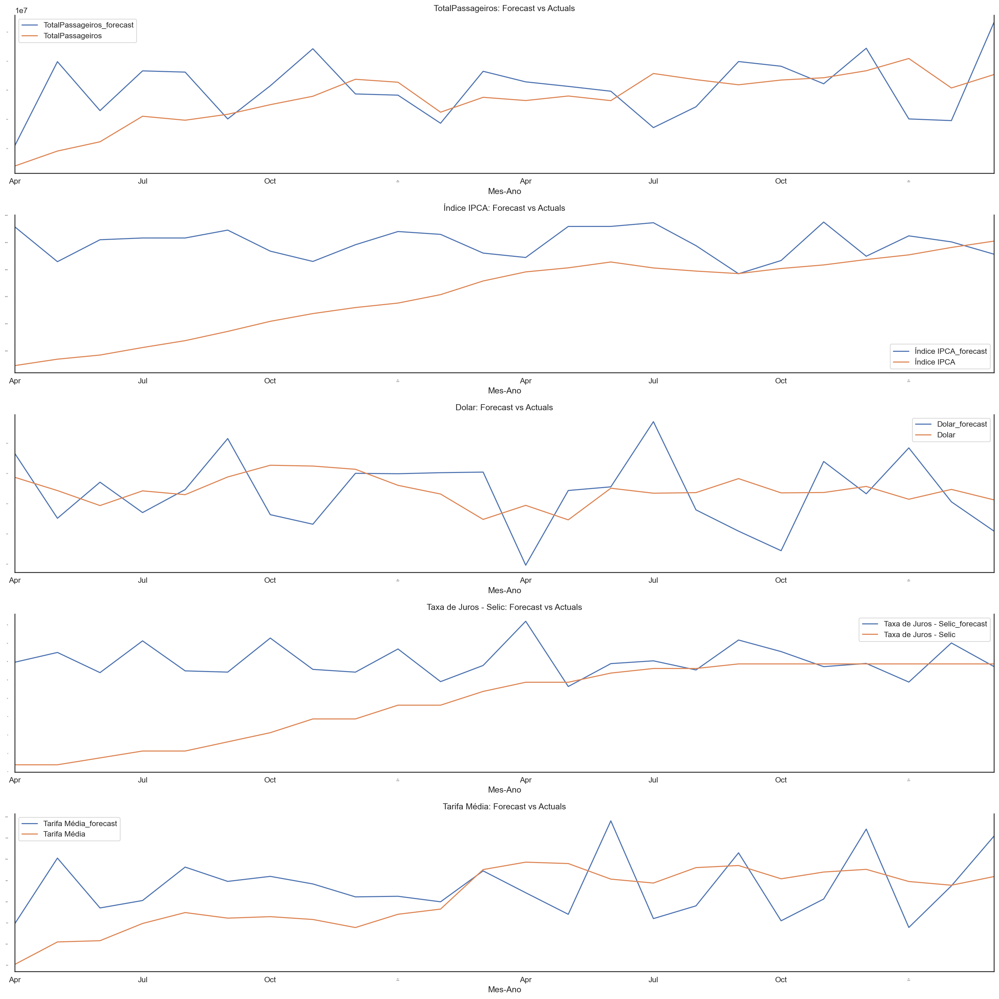

In [152]:
#Plota Previsões x Dados reais

fig, axes = plt.subplots(nrows=5, ncols=1, dpi=150, figsize=(20,20))
for i, (col,ax) in enumerate(zip(BaseConsolidada3.columns, axes.flatten())):
    df_results[col+'_forecast'].plot(legend=True, ax=ax).autoscale(axis='x',tight=True)
    BaseConsolidada3[col][-nobs:].plot(legend=True, ax=ax);
    ax.set_title(col + ": Forecast vs Actuals")
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=2)

plt.tight_layout();

In [155]:
from statsmodels.tsa.stattools import acf
def forecast_accuracy(forecast, actual):
    mape = np.mean(np.abs(forecast - actual)/np.abs(actual))  # MAPE
    me = np.mean(forecast - actual)             # ME
    mae = np.mean(np.abs(forecast - actual))    # MAE
    mpe = np.mean((forecast - actual)/actual)   # MPE
    rmse = np.mean((forecast - actual)**2)**.5  # RMSE
    corr = np.corrcoef(forecast, actual)[0,1]   # corr
    mins = np.amin(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    maxs = np.amax(np.hstack([forecast[:,None], 
                              actual[:,None]]), axis=1)
    minmax = 1 - np.mean(mins/maxs)             # minmax
    return({'mape':mape, 'me':me, 'mae': mae, 
            'mpe': mpe, 'rmse':rmse, 'corr':corr, 'minmax':minmax})

print('Forecast Accuracy of: TotalPassageiros')
accuracy_prod = forecast_accuracy(df_results['TotalPassageiros_forecast'].values, BaseConsolidada3['TotalPassageiros'][-nobs:])
for k, v in accuracy_prod.items():
    print(adjust(k), ': ', round(v,4))

Forecast Accuracy of: TotalPassageiros


C:\Users\jgjoa\AppData\Local\Temp\ipykernel_10384\2309422738.py:10: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



mape   :  0.3096
me     :  722067.9086
mae    :  2001047.8125
mpe    :  0.1652
rmse   :  2445039.5865
corr   :  0.2363
minmax :  0.2224


C:\Users\jgjoa\AppData\Local\Temp\ipykernel_10384\2309422738.py:12: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



In [156]:
A1 = model_fitted.coefs
print(f'Matriz A1: \n {A1[0]}')
print('\n') 

Matriz A1: 
 [[-1.51824453e+00 -1.59743151e+04  5.53226853e+05 -2.80185484e+05
  -4.68091468e+03 -1.07855566e+06  5.59222687e+03]
 [ 2.47620899e-05 -2.79716577e-03 -4.50092776e+00  2.14089099e+01
   1.17748176e-01 -2.22261408e+00  4.56993532e-01]
 [-1.60474950e-08 -2.95869599e-03 -9.91620944e-01 -1.45260332e-01
  -6.39067221e-04  2.51535171e-01  3.04959169e-03]
 [-3.88304723e-07 -5.91960414e-04  2.83566562e-01 -2.73132253e-01
   2.29815704e-03 -6.07874136e-01  1.21343407e-02]
 [-2.95808742e-06 -4.08995003e-01  2.40984097e+01 -2.43647407e+01
  -9.73662345e-01 -4.72073968e+00  3.20080361e-01]
 [ 2.96578054e-07  4.18781137e-03 -6.40847636e-01  7.66665037e-02
   2.37082942e-03 -2.60744969e-01  4.66844565e-03]
 [ 8.95549407e-06 -3.75713180e-02 -3.80550269e+01 -1.09030154e+01
  -1.09764668e-01  1.38684634e+01 -7.54830197e-01]]




## Regressão

https://betterdatascience.com/lime/?utm_content=cmp-true

In [103]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
import statsmodels.api as sm


In [104]:
X = BaseConsolidada3[['Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']]
y = BaseConsolidada3['TotalPassageiros']

regression = LinearRegression()


In [105]:
missing_values = BaseConsolidada3.isnull().sum()
print(missing_values)

TotalPassageiros              0
Índice IPCA                   0
Dolar                         0
Taxa de Juros - Selic         0
Tarifa Média                  0
Taxa de Desocupação(%)        0
Rend med trabalho princial    0
dtype: int64


In [106]:
# Preencher valores ausentes usando a estratégia da média
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(BaseConsolidada3[['Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']])
y = BaseConsolidada3['TotalPassageiros']

In [107]:
regression.fit(X, y)

LinearRegression()

In [108]:
coefficients = regression.coef_
coefficients

array([-3.30150381e+02, -1.03560887e+06,  1.27319102e+05,  5.60261681e+03,
        4.99758572e+03,  8.43058658e+04])

In [109]:
intercept = regression.intercept_
intercept

-4958117.715687161

In [110]:
# Converter o objeto X de volta em DataFrame
X_df = pd.DataFrame(X, columns=['Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)'])

# Criar um DataFrame para visualizar os coeficientes e interceptos
intercept_df = pd.DataFrame({'Variável': ['Intercepto'] + list(X_df.columns), 'Coeficiente': [regression.intercept_] + list(regression.coef_)})

# Exibir o DataFrame
print(intercept_df)

                     Variável   Coeficiente
0                  Intercepto -4.958118e+06
1                 Índice IPCA -3.301504e+02
2                       Dolar -1.035609e+06
3       Taxa de Juros - Selic  1.273191e+05
4                Tarifa Média  5.602617e+03
5  Rend med trabalho princial  4.997586e+03
6      Taxa de Desocupação(%)  8.430587e+04


In [111]:
# Converter o objeto X de volta em DataFrame
X_df = pd.DataFrame(X, columns=['X1', 'X2', 'X3', 'X4','X5','X6'])

# Criar uma lista de termos da fórmula
formula_terms = [f'{coef:.2f} * {variable}' for coef, variable in zip(regression.coef_, X_df.columns)]

# Adicionar o termo do intercepto
formula_terms.append(f'{regression.intercept_:.2f}')

# Criar a fórmula completa
formula = f'y = {" + ".join(formula_terms)}'

# Exibir a fórmula
print(formula)

y = -330.15 * X1 + -1035608.87 * X2 + 127319.10 * X3 + 5602.62 * X4 + 4997.59 * X5 + 84305.87 * X6 + -4958117.72


In [112]:
# Adicionar constante ao X para a regressão linear
X = sm.add_constant(X)

# Criar o modelo de regressão
model = sm.OLS(y, X)

# Ajustar o modelo
results = model.fit()


In [113]:
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:       TotalPassageiros   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     13.07
Date:                Sun, 17 Sep 2023   Prob (F-statistic):           5.67e-11
Time:                        11:14:44   Log-Likelihood:                -1708.8
No. Observations:                 111   AIC:                             3432.
Df Residuals:                     104   BIC:                             3451.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4.958e+06   6.51e+06     -0.762      0.4

## Reg Log

In [114]:
X_log = np.log(X)
y_log = np.log(y)

In [115]:
regression.fit(X_log, y_log)

LinearRegression()

In [123]:
#X

In [116]:
coefficients = regression.coef_
coefficients

array([ 0.        , -1.32582773, -0.16765547,  0.31147797,  0.93900706,
        3.02738085,  0.43534366])

In [117]:
intercept = regression.intercept_
intercept

-4.224881456838679

In [118]:
# Converter o objeto X de volta em DataFrame
Xlog_df = pd.DataFrame(X_log, columns=['Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)'])

# Criar um DataFrame para visualizar os coeficientes e interceptos
intercept_df = pd.DataFrame({'Variável': ['Intercepto'] + list(Xlog_df.columns), 'Coeficiente': [regression.intercept_] + list(regression.coef_)})

# Exibir o DataFrame
print(intercept_df)

ValueError: Shape of passed values is (111, 7), indices imply (111, 6)

In [119]:
# Converter o objeto X de volta em DataFrame
Xlog_df = pd.DataFrame(X, columns=['X1', 'X2', 'X3', 'X4','X5','X6'])

# Criar uma lista de termos da fórmula
formula_terms = [f'{coef:.2f} * {variable}' for coef, variable in zip(regression.coef_, Xlog_df.columns)]

# Adicionar o termo do intercepto
formula_terms.append(f'{regression.intercept_:.2f}')

# Criar a fórmula completa
formula = f'y = {" + ".join(formula_terms)}'

# Exibir a fórmula
print(formula)

ValueError: Shape of passed values is (111, 7), indices imply (111, 6)

# ARIMA Forescast

In [124]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from pandas.plotting import autocorrelation_plot
from pandas import DataFrame
from matplotlib import pyplot
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose


In [125]:
BaseConsolidada3log = np.log(BaseConsolidada3)

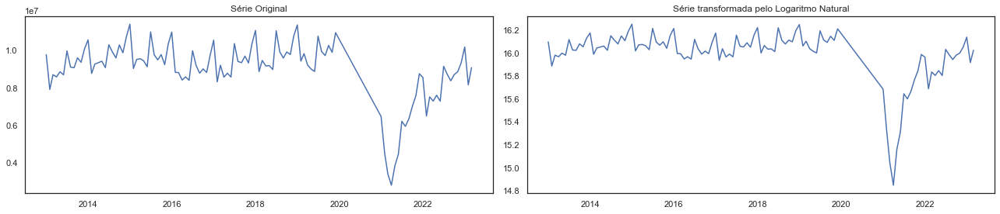

In [126]:
plt.figure(figsize=(18,4))
plt.subplot(121)
plt.plot(BaseConsolidada3['TotalPassageiros'])
plt.title('Série Original')

#Série transformada pelo LN
log = np.log(BaseConsolidada3['TotalPassageiros'])
plt.subplot(122)
plt.plot(log)
plt.title('Série transformada pelo Logaritmo Natural')
plt.tight_layout()
plt.show()

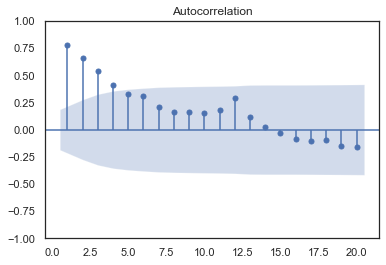

In [127]:
plot_acf(BaseConsolidada3['TotalPassageiros'], lags=20, zero=False);

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



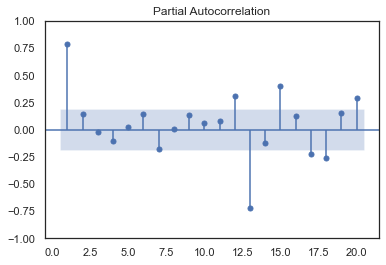

In [128]:
plot_pacf(BaseConsolidada3['TotalPassageiros'], lags=20, zero=False);


C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



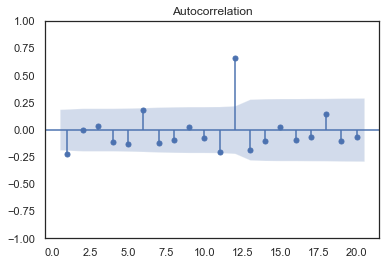

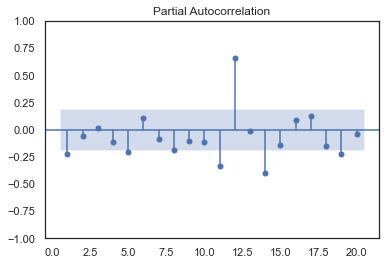

In [129]:
plot_acf(BaseConsolidada3['TotalPassageiros'].diff().dropna(), lags=20, zero=False);
plot_pacf(BaseConsolidada3['TotalPassageiros'].diff().dropna(), lags=20, zero=False);

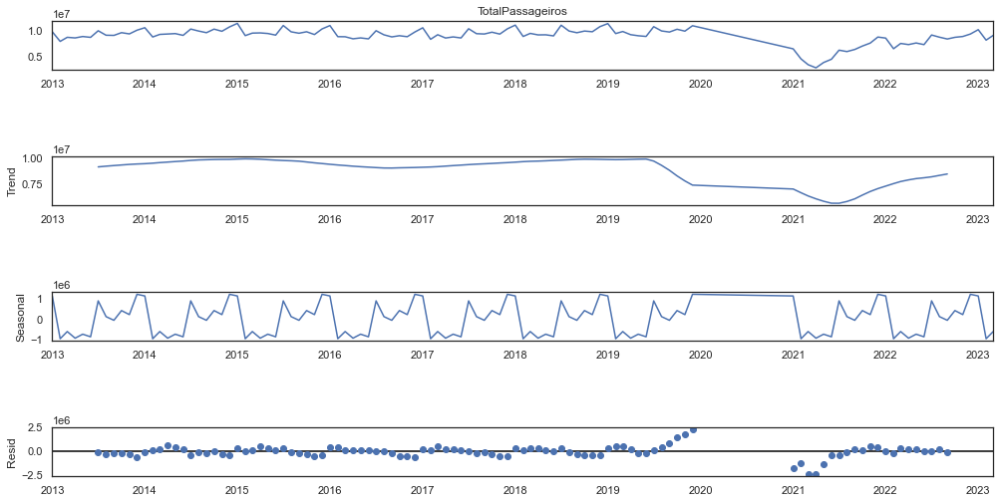

In [130]:
#gráfico semanal com ciclos que se repetem a cada 12 meses (1 ano)
season = seasonal_decompose(BaseConsolidada3['TotalPassageiros'], period = 12 )
fig = season.plot();
fig.set_size_inches(16,8)

Componentes de uma série temporal:

> Tendência: a tendência mostra uma direção geral dos dados da série temporal durante um longo período de tempo. 

> Componente cíclico: Estas são as tendências sem repetição definida em um determinado período de tempo. Um ciclo se refere ao período de altos e baixos, booms e favelas de uma série de tempo, principalmente observado em ciclos de negócios. Esses ciclos não apresentam variação sazonal, mas geralmente ocorrem em um período de 3 a 12 anos, dependendo da natureza da série temporal.

> Variação irregular: são as flutuações nos dados da série temporal que se tornam evidentes quando a tendência e as variações cíclicas são removidas. Essas variações são imprevisíveis, erráticas e podem ou não ser aleatórias.

> Decomposição ETS A decomposição
ETS é usada para separar diferentes componentes de uma série temporal. O termo ETS significa erro, tendência e sazonalidade.

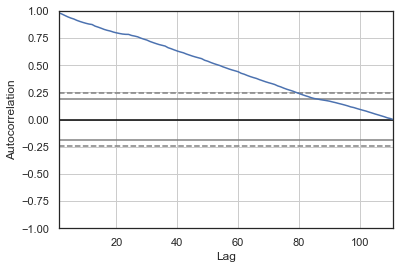

In [131]:
autocorrelation_plot(BaseConsolidada3)
pyplot.show()

In [133]:
# Ajustando o modelo ARIMA
##p = d = q = range(0, 2)
model = ARIMA(BaseConsolidada3, order=(1, 1, 1))
model_fit = model.fit()

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



ValueError: SARIMAX models require univariate `endog`. Got shape (111, 7).

In [144]:
# summary of fit model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:       TotalPassageiros   No. Observations:                  111
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -1675.907
Date:                Sun, 10 Sep 2023   AIC                           3357.814
Time:                        20:21:44   BIC                           3365.916
Sample:                             0   HQIC                          3361.100
                                - 111                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1506      0.423     -0.356      0.722      -0.981       0.679
ma.L1         -0.0640      0.421     -0.152      0.879      -0.889       0.761
sigma2      1.034e+12   4.04e-13   2.56e+24      0.0

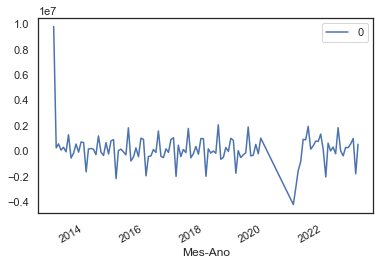

In [141]:
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()


In [142]:
# Fazendo previsões
previsoes = modelo_treinado.predict(start='01/01/2021', end='01/01/2022', dynamic=False)


NameError: name 'modelo_treinado' is not defined

In [ ]:
# Visualizando as previsões
print(previsoes)

In [ ]:
# Avaliar o desempenho do modelo
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

In [159]:
X = BaseConsolidada3[['Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']]
y = BaseConsolidada3['TotalPassageiros']

In [160]:
missing_values = X.isnull().sum()
print(missing_values)

Índice IPCA                   0
Dolar                         0
Taxa de Juros - Selic         0
Tarifa Média                  0
Rend med trabalho princial    0
Taxa de Desocupação(%)        0
dtype: int64


In [161]:
# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Criar o modelo de regressão linear
model = LinearRegression()

# Treinar o modelo com os dados de treinamento
model.fit(X_train, y_train)

LinearRegression()

In [162]:
# Fazer previsões com os dados de teste
y_pred = model.predict(X_test)

In [163]:
# Avaliar o desempenho do modelo
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 1852936313834.0632


In [118]:
# Valores fictícios para fazer previsões
novos_dados = {
    'Índice IPCA': [0.1, 0.3],
    'Dolar': [5.8, 5.4],
    'Taxa de Juros - Selic': [3, 13],
    'Tarifa Média': [400, 600],
    'Rend med trabalho princial':[2000,3000],
    'Taxa de Desocupação(%)': [5,10]
    
}

# Criar um DataFrame com os valores fictícios para previsão
novos_df = pd.DataFrame(novos_dados)

# Fazer previsões com os valores fictícios
novas_previsoes = model.predict(novos_df)

print('Previsões para novos dados:')
print(novas_previsoes)

Previsões para novos dados:
[ 6209694.18819025 12223548.11489593]


In [164]:
# Criar o modelo Random Forest Regressor
model2 = RandomForestRegressor(n_estimators=100, random_state=42)

# Treinar o modelo com os dados de treinamento
model2.fit(X_train, y_train)

# Fazer previsões com os dados de teste
y_pred2 = model2.predict(X_test)

# Avaliar o desempenho do modelo
mse2 = mean_squared_error(y_test, y_pred2)
print(f'Mean Squared Error (Random Forest): {mse2}')

Mean Squared Error (Random Forest): 1153461054859.4512


# Aplicação VARIMA

In [173]:
from statsmodels.tsa.api import VARMAX
from sklearn.metrics import mean_absolute_percentage_error
df_differenced2

In [183]:
order = (1,1)
Varima = VARMAX(BaseConsolidada3[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']], order=order)
Varima_fit = model.fit()

VarimaDif = VARMAX(df_differenced2[['TotalPassageiros','Índice IPCA','Dolar','Taxa de Juros - Selic','Tarifa Média','Rend med trabalho princial','Taxa de Desocupação(%)']], order=order)
VarimaDif_fit = model.fit()


C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning:

Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:374: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\jgjoa\anaconda3\lib\site-packages\scipy\linalg\_solvers.py:214: LinAlgWarning:

Ill-conditioned matrix (rcond=4.03878e-25): result may not be accurate.

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmo

In [159]:
print(Varima_fit.summary())

                                                                                         Statespace Model Results                                                                                        
Dep. Variable:     ['TotalPassageiros', 'Índice IPCA', 'Dolar', 'Taxa de Juros - Selic', 'Tarifa Média', 'Rend med trabalho princial', 'Taxa de Desocupação(%)']   No. Observations:                  111
Model:                                                                                                                                                VARMA(1,1)   Log Likelihood              -18038.707
                                                                                                                                                     + intercept   AIC                          36343.413
Date:                                                                                                                                           Sun, 17 Sep 2023   BIC                          

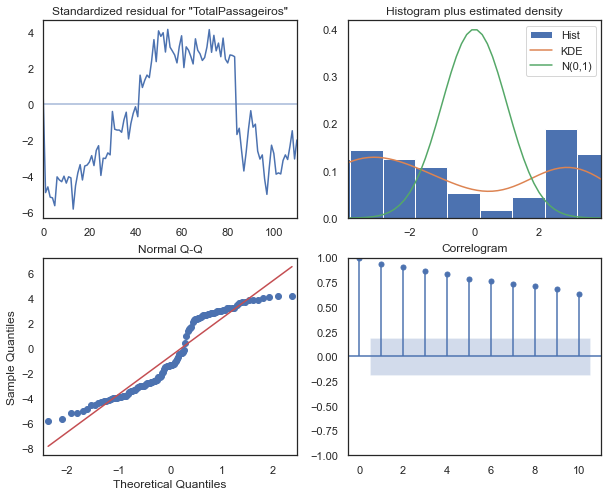

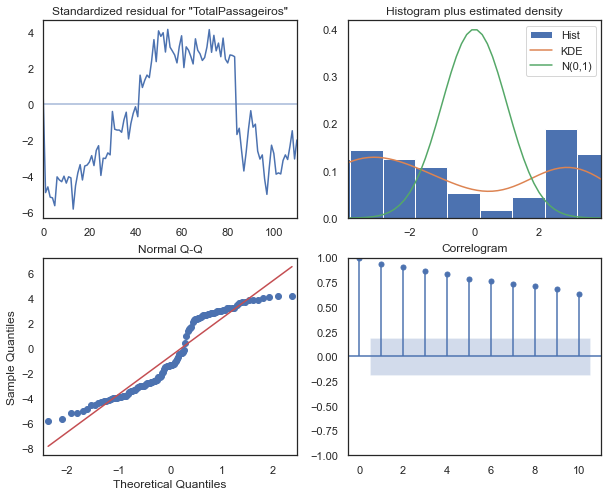

In [160]:
Varima_fit.plot_diagnostics(figsize=(10, 8))


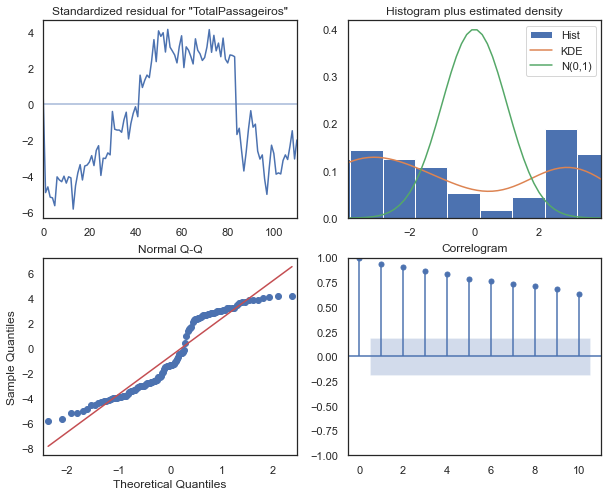

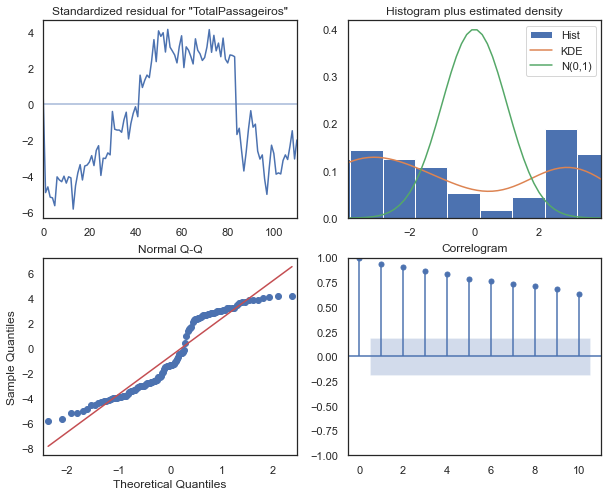

In [184]:
VarimaDif_fit.plot_diagnostics(figsize=(10, 8))

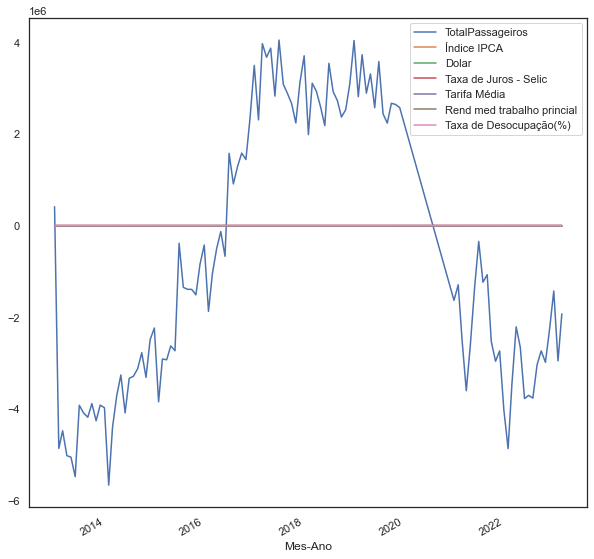

In [162]:
# line plot of residuals
residuals = DataFrame(Varima_fit.resid)
residuals.plot(figsize = (10,10))
plt.show()


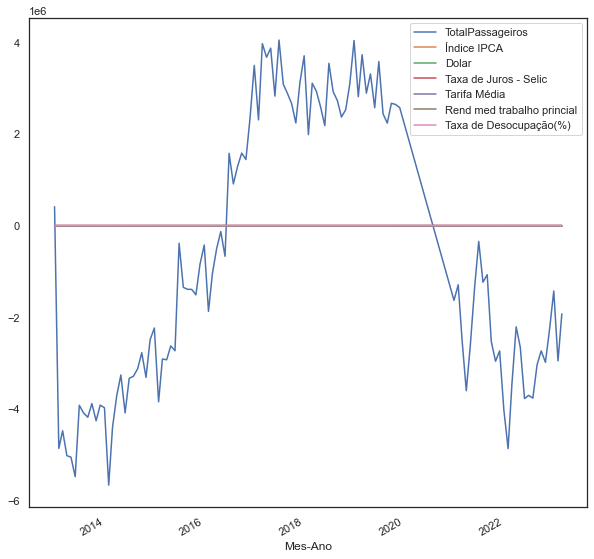

In [185]:
# line plot of residuals
residuals = DataFrame(VarimaDif_fit.resid)
residuals.plot(figsize = (10,10))
plt.show()

In [166]:
nobs = 12
fc = Varima_fit.predict(y=forecast_input, steps=nobs)
df_forecast = pd.DataFrame(fc, index=BaseConsolidada3.index[-nobs:], columns=BaseConsolidada3.columns + '_1d')
df_forecast

,TotalPassageiros_1d,Índice IPCA_1d,Dolar_1d,Taxa de Juros - Selic_1d,Tarifa Média_1d,Taxa de Desocupação(%)_1d,Rend med trabalho princial_1d
Mes-Ano,,,,,,,
2022-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-07-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-12-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [188]:
df_differenced2

,TotalPassageiros,Índice IPCA,Dolar,Taxa de Juros - Selic,Tarifa Média,Taxa de Desocupação(%),Rend med trabalho princial
Mes-Ano,,,,,,,
2013-03-01,2645843.0,-4.62,0.0547,0.00,-5.76,-2.000000e-01,3.0
2013-04-01,-906787.0,3.02,-0.0665,0.00,-12.74,-5.000000e-01,-14.0
2013-05-01,391091.0,-6.54,0.1633,0.25,45.81,-8.881784e-16,-4.0
2013-06-01,-433879.0,-4.02,-0.0511,0.25,19.41,0.000000e+00,20.0
2013-07-01,1435713.0,-8.53,-0.0448,-0.50,46.19,1.000000e-01,-3.0
...,...,...,...,...,...,...,...
2022-11-01,-168477.0,-11.32,0.2423,0.00,94.57,2.000000e-01,6.0
2022-12-01,321524.0,13.62,0.0949,0.00,-19.32,1.776357e-15,-22.0
2023-01-01,361891.0,-5.58,-0.3138,0.00,-69.89,7.000000e-01,6.0


In [190]:
# Calcule métricas de desempenho
predicted_values = Varima_fit.forecast(steps=111) 
actual_values = BaseConsolidada3

predicted_values_Dif = VarimaDif_fit.forecast(steps=109) 
actual_values_Dif = df_differenced2

# Calcule métricas de desempenho
mae = mean_absolute_error(actual_values, predicted_values)
mse = mean_squared_error(actual_values, predicted_values)

mae_dif = mean_absolute_error(actual_values_Dif, predicted_values_Dif)
mse_dif = mean_squared_error(actual_values_Dif, predicted_values_Dif)

# Exiba as métricas
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")

print(f"Mean Absolute Error (MAE) Dif: {mae_dif}")
print(f"Mean Squared Error (MSE) Dif: {mse_dif}")

Mean Absolute Error (MAE): 146805.39655088063
Mean Squared Error (MSE): 365783695037.43085
Mean Absolute Error (MAE) Dif: 1335566.8550809515
Mean Squared Error (MSE) Dif: 12836544810787.2


C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [177]:
fcst = Varima_fit.forecast(exog=BaseConsolidada3.values, steps=10)
mape = mean_absolute_percentage_error(BaseConsolidada3['TotalPassageiros'], fcst)
model_accuracy = 1 - mape
print(model_accuracy)

C:\Users\jgjoa\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



ValueError: Found input variables with inconsistent numbers of samples: [111, 10]